# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [3]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

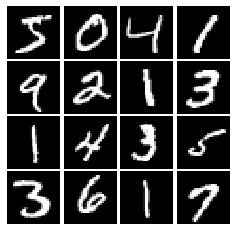

In [4]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [5]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    relu = tf.maximum(x, alpha * x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return relu

Test your leaky ReLU implementation. You should get errors < 1e-10

In [6]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [7]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    noise = tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return noise


Make sure noise is the correct shape and type:

In [8]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [9]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    from tensorflow.keras import layers
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        layers.Dense(256, input_shape=(784,),activation=leaky_relu),
        layers.Dense(256, activation=leaky_relu),
        layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [10]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [11]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    from tensorflow.keras import layers
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
        layers.Dense(1024, activation='relu'),
        layers.Dense(784, activation='tanh')
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [12]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [13]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    real = tf.ones(logits_real.shape)
    fake = tf.zeros(logits_fake.shape)
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    real_loss = bce(real, logits_real)
    fake_loss = bce(fake, logits_fake)
    
    loss = real_loss + fake_loss

    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    fake = tf.ones(logits_fake.shape)
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(fake, logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [14]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [15]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [16]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate,beta_1 = beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate,beta_1 = beta1)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [17]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.495, G:0.7031
Instructions for updating:
Use tf.identity instead.


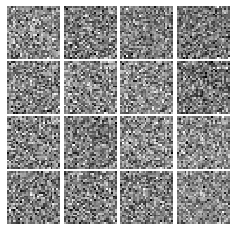

Epoch: 0, Iter: 20, D: 0.5982, G:0.9044


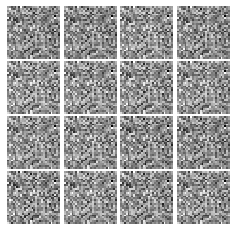

Epoch: 0, Iter: 40, D: 0.4852, G:1.021


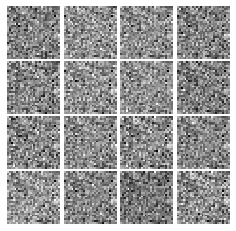

Epoch: 0, Iter: 60, D: 1.741, G:0.8186


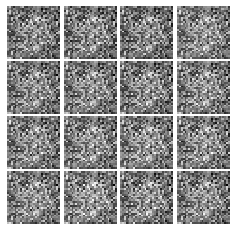

Epoch: 0, Iter: 80, D: 1.045, G:1.481


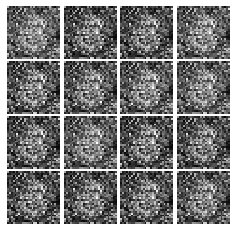

Epoch: 0, Iter: 100, D: 2.029, G:1.345


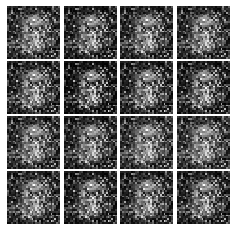

Epoch: 0, Iter: 120, D: 1.359, G:1.556


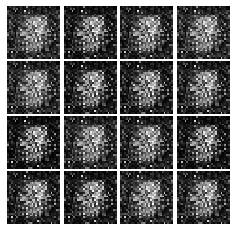

Epoch: 0, Iter: 140, D: 1.549, G:1.583


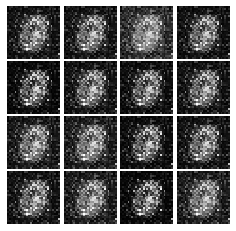

Epoch: 0, Iter: 160, D: 1.301, G:1.418


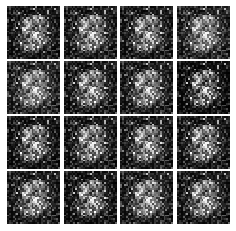

Epoch: 0, Iter: 180, D: 1.13, G:1.475


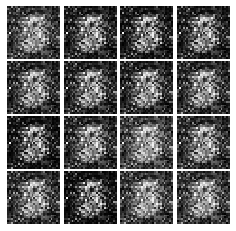

Epoch: 0, Iter: 200, D: 1.239, G:1.434


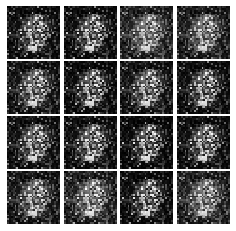

Epoch: 0, Iter: 220, D: 1.736, G:0.9358


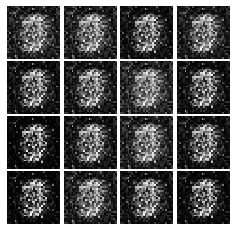

Epoch: 0, Iter: 240, D: 2.469, G:1.036


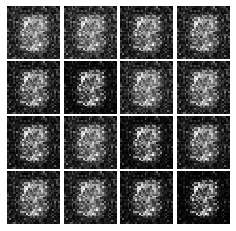

Epoch: 0, Iter: 260, D: 1.347, G:1.186


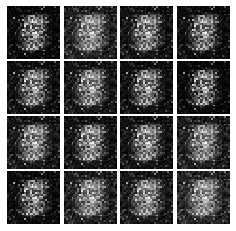

Epoch: 0, Iter: 280, D: 0.8797, G:2.059


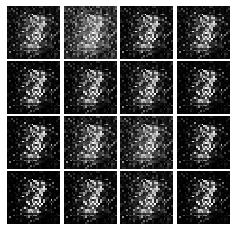

Epoch: 0, Iter: 300, D: 1.231, G:1.355


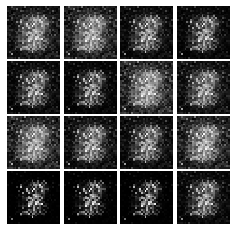

Epoch: 0, Iter: 320, D: 1.039, G:0.9656


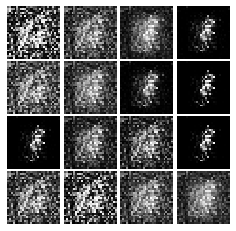

Epoch: 0, Iter: 340, D: 1.214, G:1.073


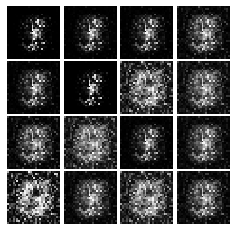

Epoch: 0, Iter: 360, D: 1.139, G:1.596


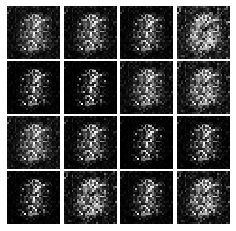

Epoch: 0, Iter: 380, D: 0.9728, G:1.128


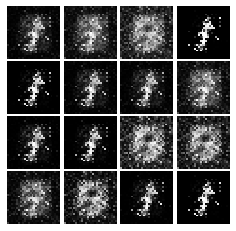

Epoch: 0, Iter: 400, D: 1.157, G:1.411


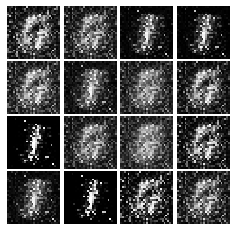

Epoch: 0, Iter: 420, D: 0.8353, G:1.361


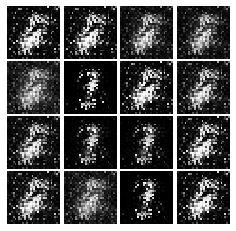

Epoch: 0, Iter: 440, D: 1.359, G:1.377


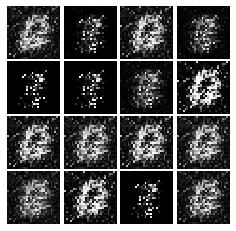

Epoch: 0, Iter: 460, D: 0.7006, G:1.791


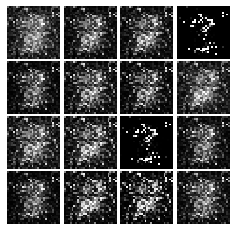

Epoch: 1, Iter: 480, D: 1.506, G:1.05


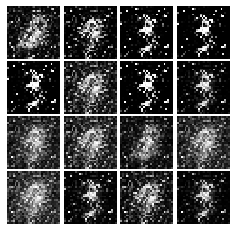

Epoch: 1, Iter: 500, D: 1.531, G:0.08391


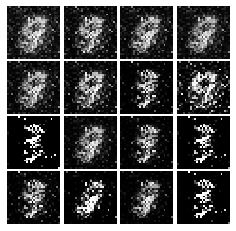

Epoch: 1, Iter: 520, D: 1.176, G:1.402


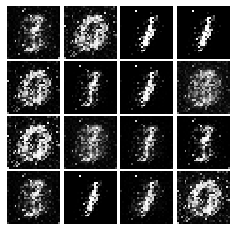

Epoch: 1, Iter: 540, D: 1.111, G:1.522


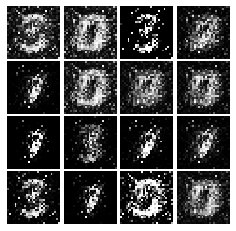

Epoch: 1, Iter: 560, D: 1.197, G:1.247


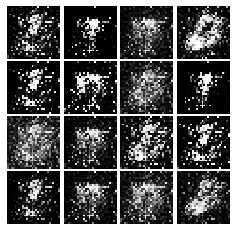

Epoch: 1, Iter: 580, D: 1.019, G:1.53


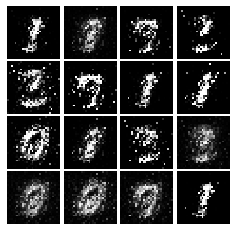

Epoch: 1, Iter: 600, D: 1.175, G:1.544


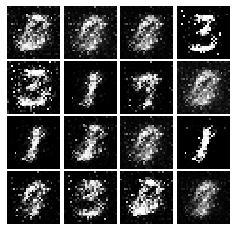

Epoch: 1, Iter: 620, D: 1.141, G:1.346


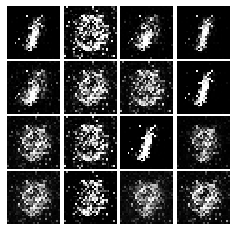

Epoch: 1, Iter: 640, D: 0.8538, G:1.588


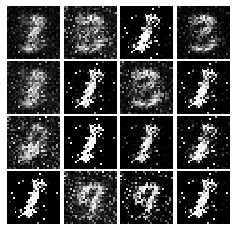

Epoch: 1, Iter: 660, D: 1.689, G:1.49


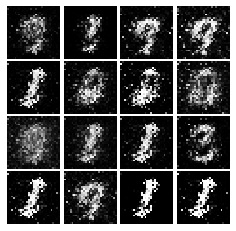

Epoch: 1, Iter: 680, D: 1.125, G:1.314


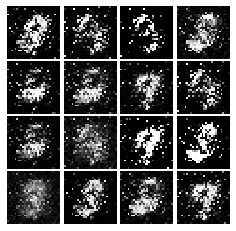

Epoch: 1, Iter: 700, D: 1.122, G:1.997


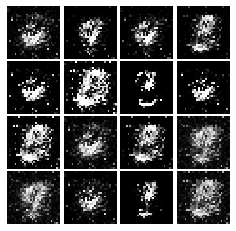

Epoch: 1, Iter: 720, D: 1.217, G:1.527


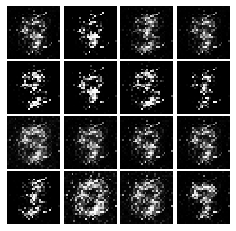

Epoch: 1, Iter: 740, D: 1.451, G:1.212


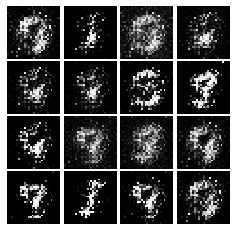

Epoch: 1, Iter: 760, D: 1.309, G:1.279


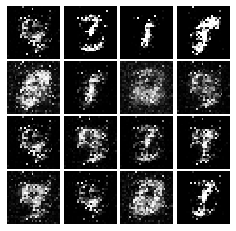

Epoch: 1, Iter: 780, D: 1.307, G:1.231


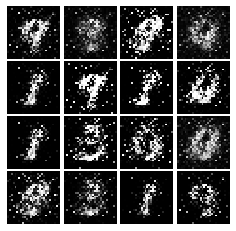

Epoch: 1, Iter: 800, D: 1.726, G:1.192


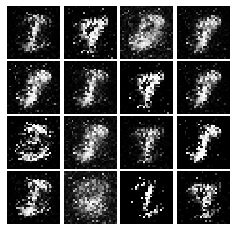

Epoch: 1, Iter: 820, D: 1.579, G:1.06


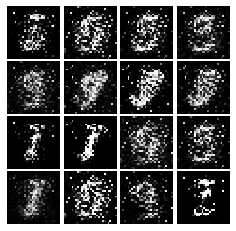

Epoch: 1, Iter: 840, D: 1.028, G:1.323


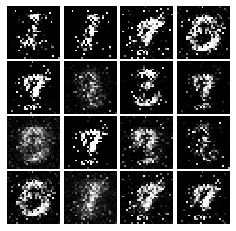

Epoch: 1, Iter: 860, D: 1.01, G:1.159


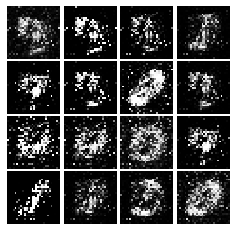

Epoch: 1, Iter: 880, D: 1.258, G:1.134


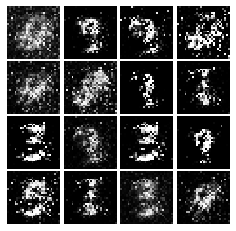

Epoch: 1, Iter: 900, D: 1.16, G:1.283


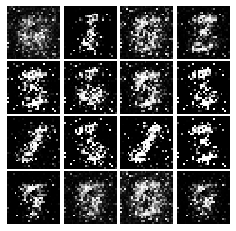

Epoch: 1, Iter: 920, D: 1.248, G:1.041


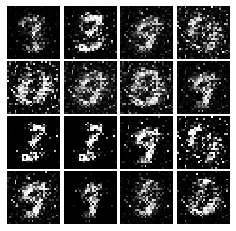

Epoch: 2, Iter: 940, D: 1.084, G:1.275


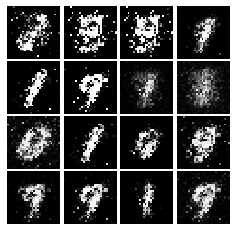

Epoch: 2, Iter: 960, D: 1.027, G:2.015


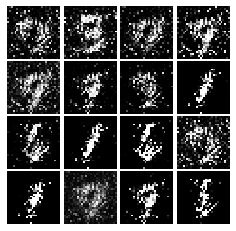

Epoch: 2, Iter: 980, D: 1.11, G:1.169


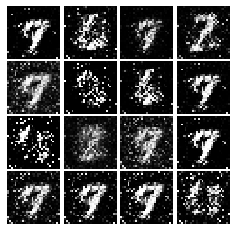

Epoch: 2, Iter: 1000, D: 1.133, G:1.152


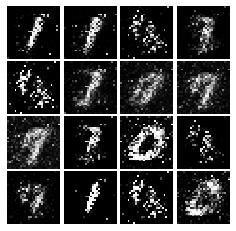

Epoch: 2, Iter: 1020, D: 1.048, G:1.186


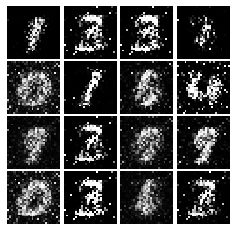

Epoch: 2, Iter: 1040, D: 1.175, G:1.635


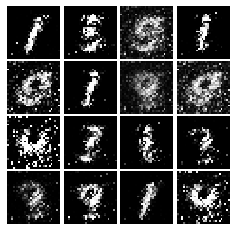

Epoch: 2, Iter: 1060, D: 1.012, G:1.078


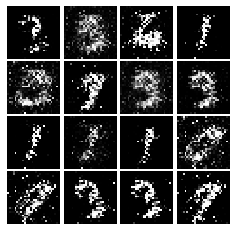

Epoch: 2, Iter: 1080, D: 1.365, G:0.9705


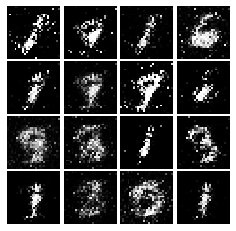

Epoch: 2, Iter: 1100, D: 1.143, G:1.503


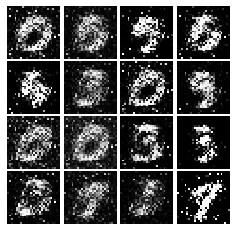

Epoch: 2, Iter: 1120, D: 1.353, G:1.07


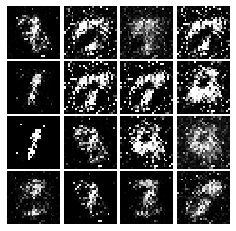

Epoch: 2, Iter: 1140, D: 1.272, G:2.419


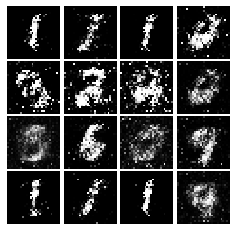

Epoch: 2, Iter: 1160, D: 1.019, G:0.956


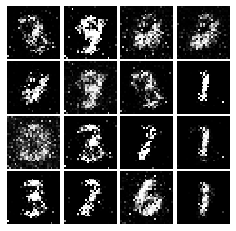

Epoch: 2, Iter: 1180, D: 1.048, G:1.448


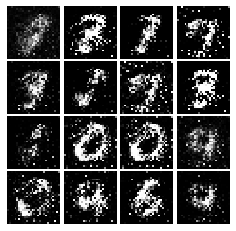

Epoch: 2, Iter: 1200, D: 1.233, G:1.118


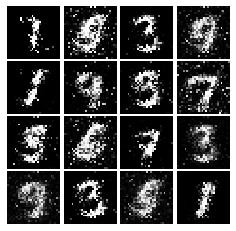

Epoch: 2, Iter: 1220, D: 1.48, G:2.277


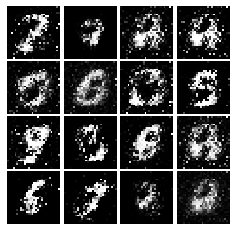

Epoch: 2, Iter: 1240, D: 1.172, G:1.949


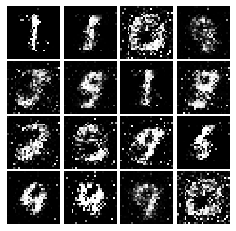

Epoch: 2, Iter: 1260, D: 1.178, G:1.073


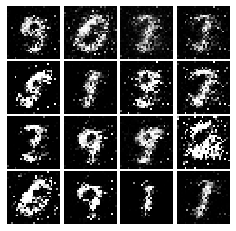

Epoch: 2, Iter: 1280, D: 1.103, G:1.386


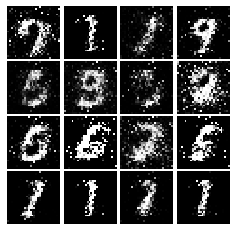

Epoch: 2, Iter: 1300, D: 1.009, G:1.478


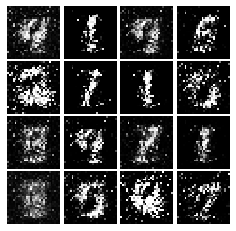

Epoch: 2, Iter: 1320, D: 1.239, G:0.9392


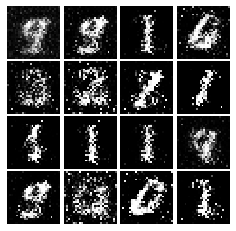

Epoch: 2, Iter: 1340, D: 1.196, G:1.116


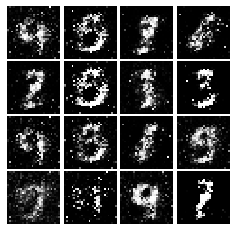

Epoch: 2, Iter: 1360, D: 1.166, G:1.239


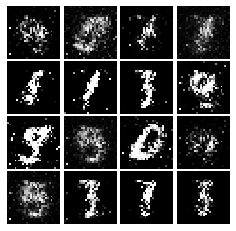

Epoch: 2, Iter: 1380, D: 1.096, G:0.8963


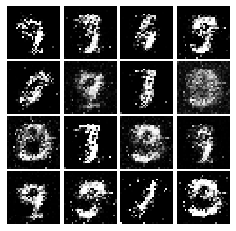

Epoch: 2, Iter: 1400, D: 1.056, G:1.085


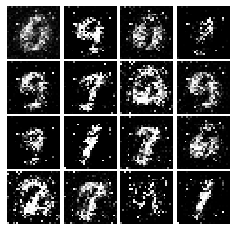

Epoch: 3, Iter: 1420, D: 1.197, G:0.7409


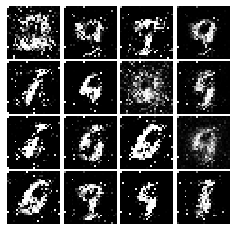

Epoch: 3, Iter: 1440, D: 1.181, G:0.9998


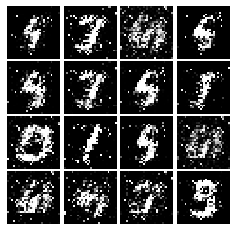

Epoch: 3, Iter: 1460, D: 1.113, G:1.362


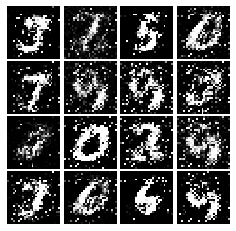

Epoch: 3, Iter: 1480, D: 1.187, G:0.9625


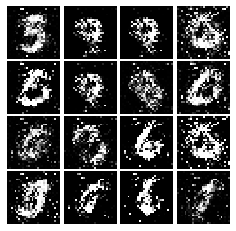

Epoch: 3, Iter: 1500, D: 1.182, G:1.484


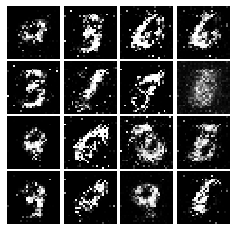

Epoch: 3, Iter: 1520, D: 1.171, G:0.9677


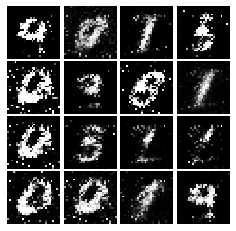

Epoch: 3, Iter: 1540, D: 1.309, G:2.273


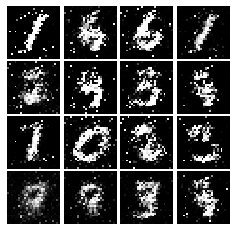

Epoch: 3, Iter: 1560, D: 1.09, G:0.9032


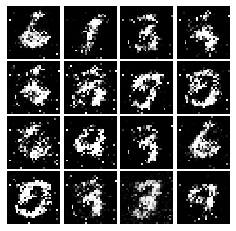

Epoch: 3, Iter: 1580, D: 1.224, G:1.107


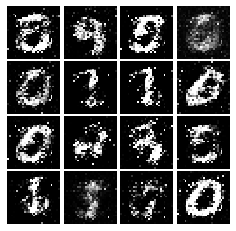

Epoch: 3, Iter: 1600, D: 1.202, G:1.069


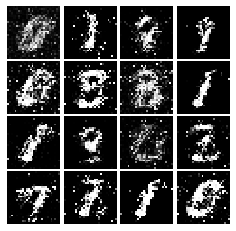

Epoch: 3, Iter: 1620, D: 1.152, G:0.9727


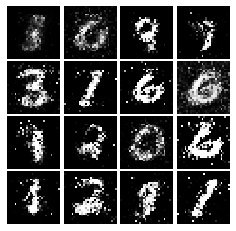

Epoch: 3, Iter: 1640, D: 1.268, G:1.901


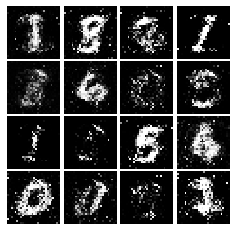

Epoch: 3, Iter: 1660, D: 1.142, G:1.413


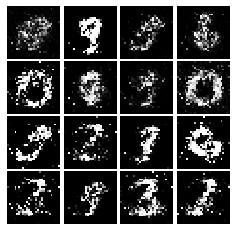

Epoch: 3, Iter: 1680, D: 1.199, G:1.107


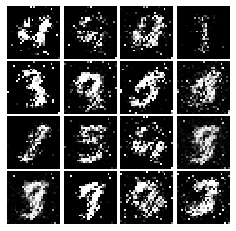

Epoch: 3, Iter: 1700, D: 1.264, G:1.141


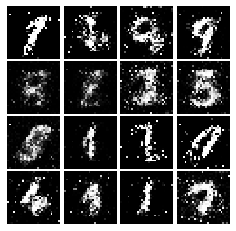

Epoch: 3, Iter: 1720, D: 1.107, G:0.6902


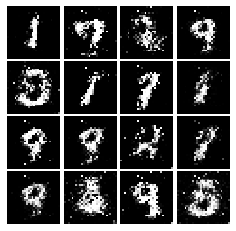

Epoch: 3, Iter: 1740, D: 1.264, G:1.027


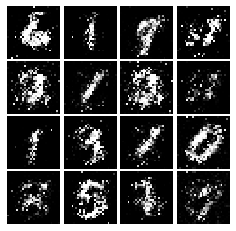

Epoch: 3, Iter: 1760, D: 1.191, G:1.024


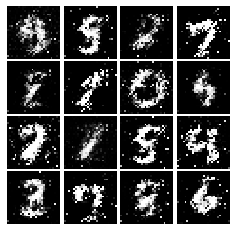

Epoch: 3, Iter: 1780, D: 1.256, G:0.9532


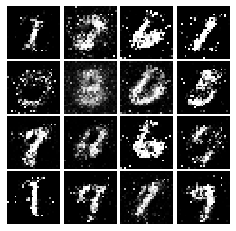

Epoch: 3, Iter: 1800, D: 1.438, G:0.7148


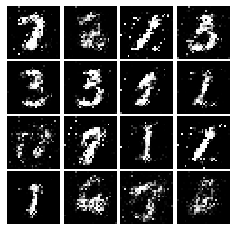

Epoch: 3, Iter: 1820, D: 1.247, G:0.93


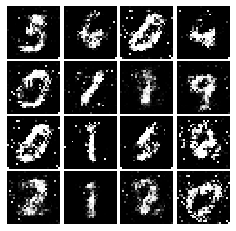

Epoch: 3, Iter: 1840, D: 1.302, G:0.8313


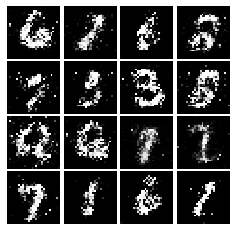

Epoch: 3, Iter: 1860, D: 1.384, G:0.8181


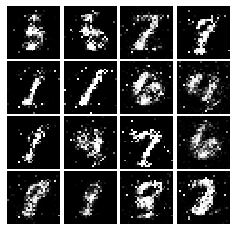

Epoch: 4, Iter: 1880, D: 1.238, G:0.8051


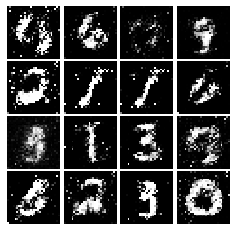

Epoch: 4, Iter: 1900, D: 1.241, G:0.9607


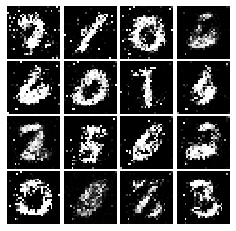

Epoch: 4, Iter: 1920, D: 1.294, G:0.8683


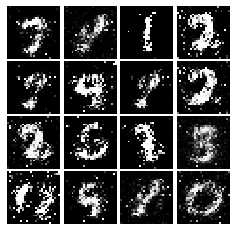

Epoch: 4, Iter: 1940, D: 1.244, G:1.121


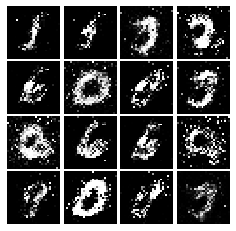

Epoch: 4, Iter: 1960, D: 1.179, G:0.7433


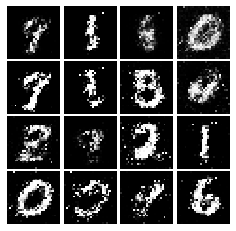

Epoch: 4, Iter: 1980, D: 1.467, G:0.8495


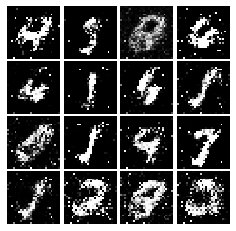

Epoch: 4, Iter: 2000, D: 1.425, G:0.8722


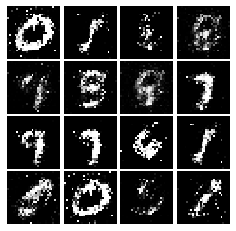

Epoch: 4, Iter: 2020, D: 1.285, G:0.9329


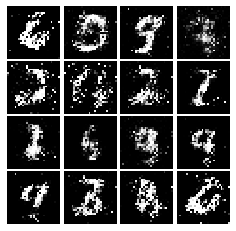

Epoch: 4, Iter: 2040, D: 1.262, G:0.997


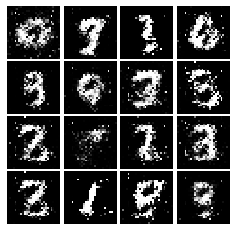

Epoch: 4, Iter: 2060, D: 1.232, G:0.9205


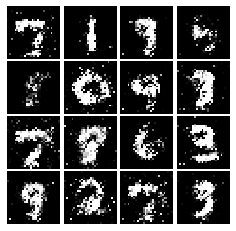

Epoch: 4, Iter: 2080, D: 1.393, G:0.8363


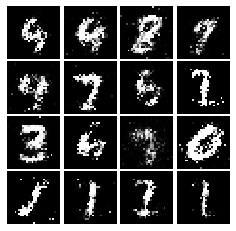

Epoch: 4, Iter: 2100, D: 1.284, G:1.275


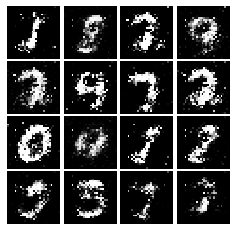

Epoch: 4, Iter: 2120, D: 1.22, G:0.8774


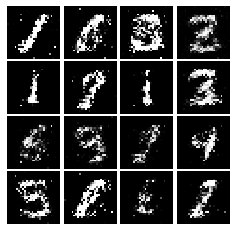

Epoch: 4, Iter: 2140, D: 1.221, G:1.501


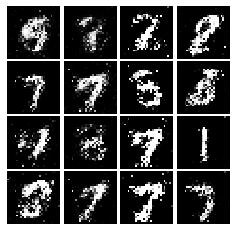

Epoch: 4, Iter: 2160, D: 1.292, G:0.8611


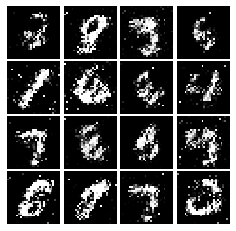

Epoch: 4, Iter: 2180, D: 1.296, G:0.9802


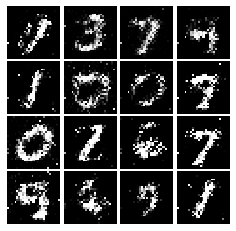

Epoch: 4, Iter: 2200, D: 1.302, G:0.8963


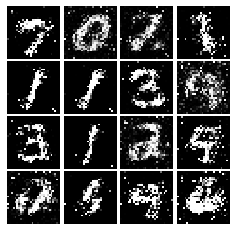

Epoch: 4, Iter: 2220, D: 1.27, G:0.9467


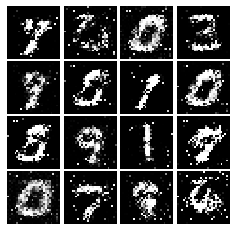

Epoch: 4, Iter: 2240, D: 1.282, G:0.8741


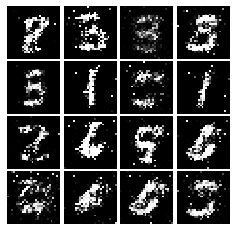

Epoch: 4, Iter: 2260, D: 1.326, G:0.9627


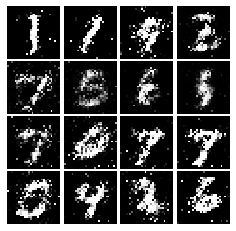

Epoch: 4, Iter: 2280, D: 1.305, G:0.9087


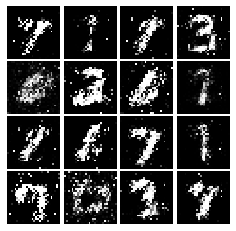

Epoch: 4, Iter: 2300, D: 1.308, G:0.8191


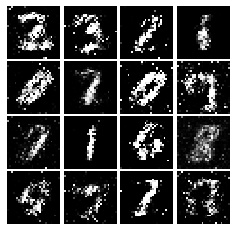

Epoch: 4, Iter: 2320, D: 1.254, G:0.7858


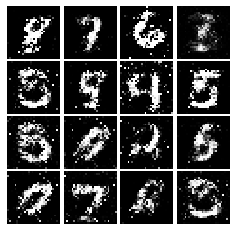

Epoch: 4, Iter: 2340, D: 1.202, G:0.8238


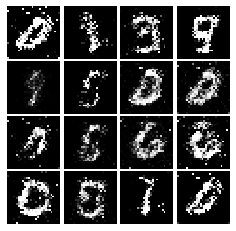

Epoch: 5, Iter: 2360, D: 1.186, G:0.8958


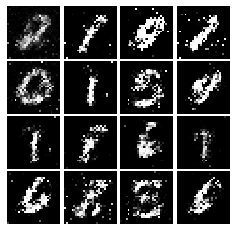

Epoch: 5, Iter: 2380, D: 1.296, G:0.9362


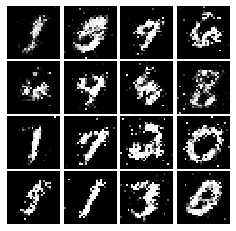

Epoch: 5, Iter: 2400, D: 1.213, G:0.9253


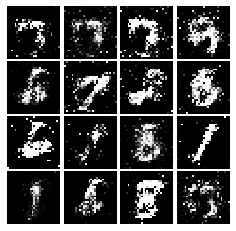

Epoch: 5, Iter: 2420, D: 1.234, G:0.8877


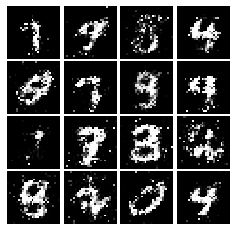

Epoch: 5, Iter: 2440, D: 1.353, G:0.6025


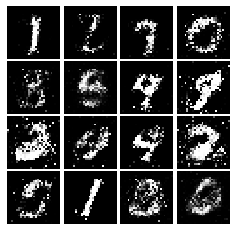

Epoch: 5, Iter: 2460, D: 1.217, G:0.8638


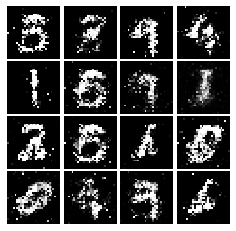

Epoch: 5, Iter: 2480, D: 1.323, G:0.8893


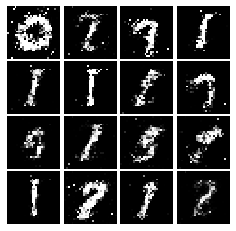

Epoch: 5, Iter: 2500, D: 1.278, G:0.9767


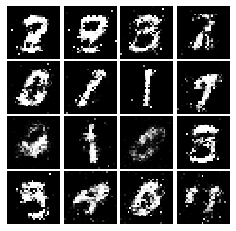

Epoch: 5, Iter: 2520, D: 1.319, G:0.8364


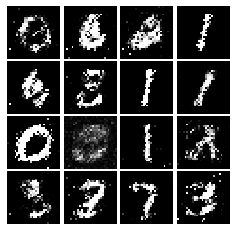

Epoch: 5, Iter: 2540, D: 1.316, G:0.9134


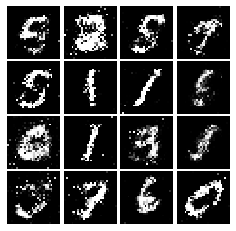

Epoch: 5, Iter: 2560, D: 1.298, G:1.054


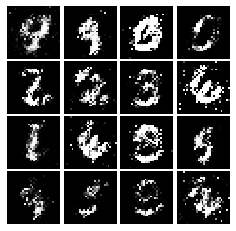

Epoch: 5, Iter: 2580, D: 1.293, G:0.8362


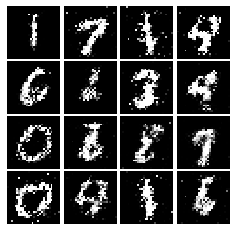

Epoch: 5, Iter: 2600, D: 1.465, G:0.6758


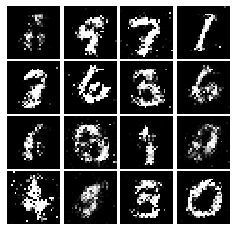

Epoch: 5, Iter: 2620, D: 1.19, G:0.9334


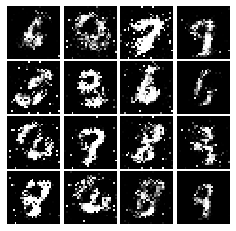

Epoch: 5, Iter: 2640, D: 1.317, G:1.054


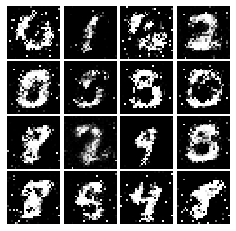

Epoch: 5, Iter: 2660, D: 1.198, G:0.8679


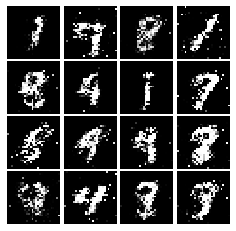

Epoch: 5, Iter: 2680, D: 1.432, G:0.8836


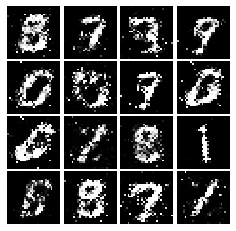

Epoch: 5, Iter: 2700, D: 1.289, G:0.9139


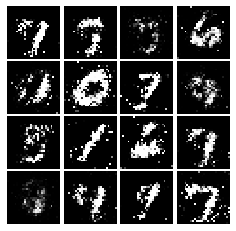

Epoch: 5, Iter: 2720, D: 1.269, G:0.8681


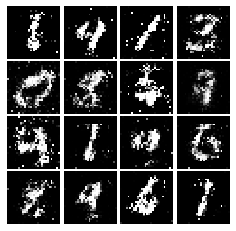

Epoch: 5, Iter: 2740, D: 1.33, G:0.7939


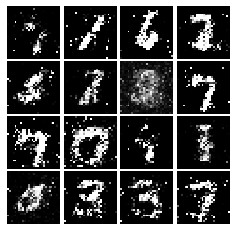

Epoch: 5, Iter: 2760, D: 1.321, G:0.9986


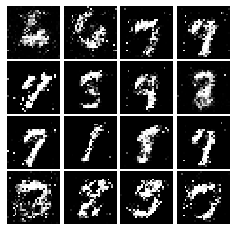

Epoch: 5, Iter: 2780, D: 1.261, G:0.7744


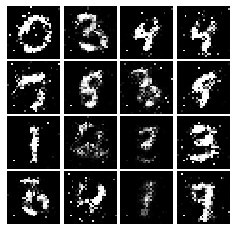

Epoch: 5, Iter: 2800, D: 1.351, G:0.7831


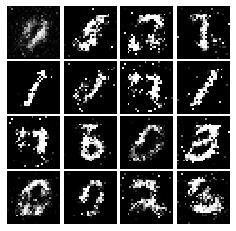

Epoch: 6, Iter: 2820, D: 1.322, G:0.7479


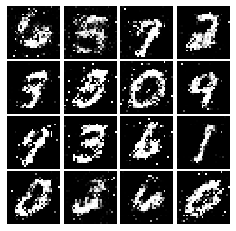

Epoch: 6, Iter: 2840, D: 1.318, G:0.8679


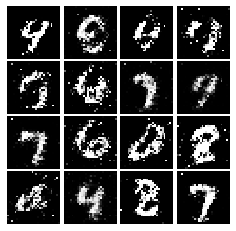

Epoch: 6, Iter: 2860, D: 1.341, G:0.8079


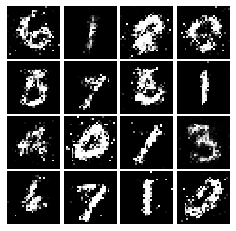

Epoch: 6, Iter: 2880, D: 1.239, G:0.8037


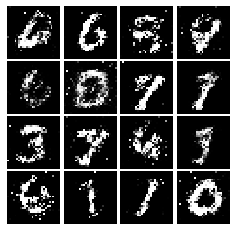

Epoch: 6, Iter: 2900, D: 1.299, G:0.7795


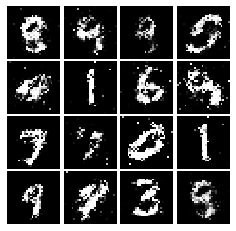

Epoch: 6, Iter: 2920, D: 1.368, G:0.8209


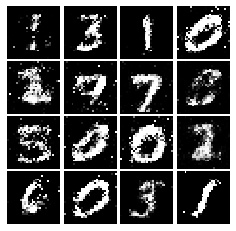

Epoch: 6, Iter: 2940, D: 1.333, G:0.8861


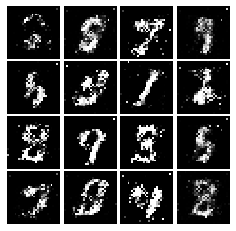

Epoch: 6, Iter: 2960, D: 1.347, G:0.7575


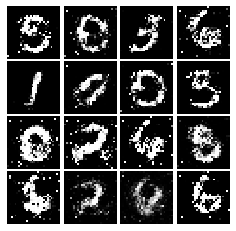

Epoch: 6, Iter: 2980, D: 1.388, G:0.7902


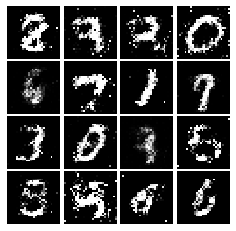

Epoch: 6, Iter: 3000, D: 1.352, G:0.8348


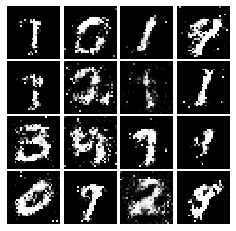

Epoch: 6, Iter: 3020, D: 1.26, G:0.9257


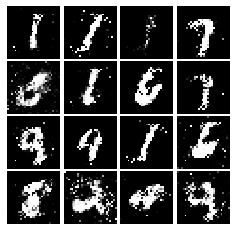

Epoch: 6, Iter: 3040, D: 1.282, G:0.8429


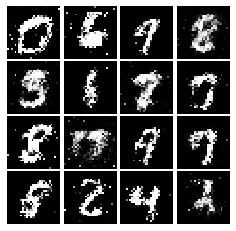

Epoch: 6, Iter: 3060, D: 1.288, G:0.739


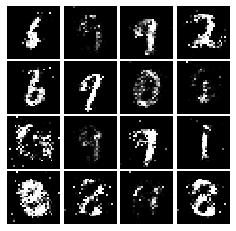

Epoch: 6, Iter: 3080, D: 1.336, G:0.7923


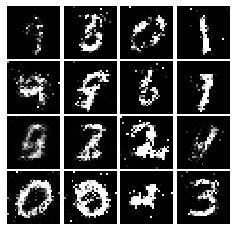

Epoch: 6, Iter: 3100, D: 1.325, G:0.7528


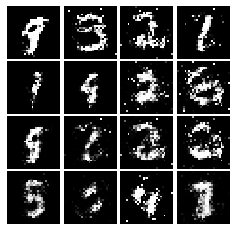

Epoch: 6, Iter: 3120, D: 1.337, G:0.8525


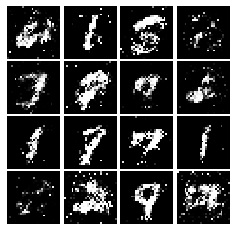

Epoch: 6, Iter: 3140, D: 1.328, G:0.8208


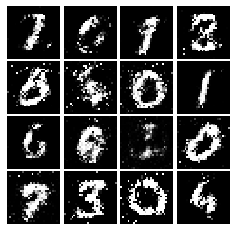

Epoch: 6, Iter: 3160, D: 1.249, G:0.8645


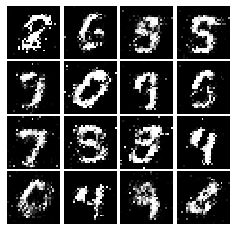

Epoch: 6, Iter: 3180, D: 1.4, G:0.9796


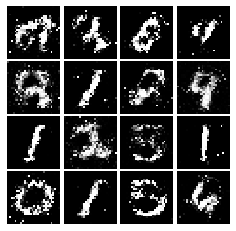

Epoch: 6, Iter: 3200, D: 1.33, G:0.9394


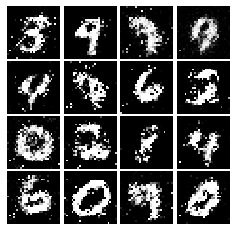

Epoch: 6, Iter: 3220, D: 1.358, G:0.8436


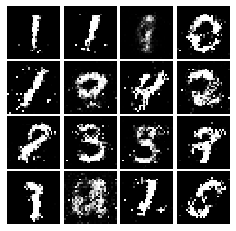

Epoch: 6, Iter: 3240, D: 1.368, G:0.7574


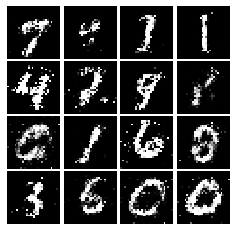

Epoch: 6, Iter: 3260, D: 1.35, G:0.9475


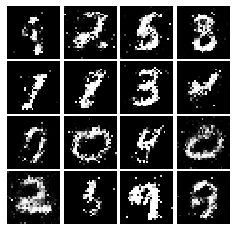

Epoch: 6, Iter: 3280, D: 1.387, G:0.826


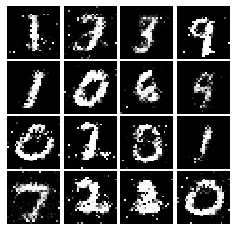

Epoch: 7, Iter: 3300, D: 1.277, G:0.8638


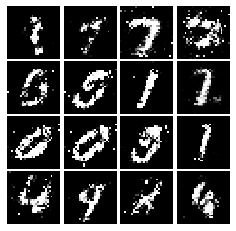

Epoch: 7, Iter: 3320, D: 1.411, G:0.7117


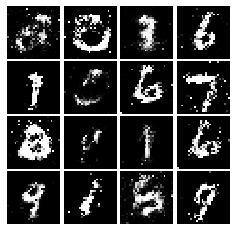

Epoch: 7, Iter: 3340, D: 1.308, G:0.8438


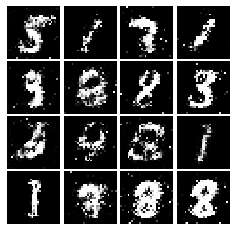

Epoch: 7, Iter: 3360, D: 1.426, G:0.8977


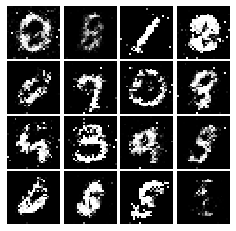

Epoch: 7, Iter: 3380, D: 1.351, G:0.8165


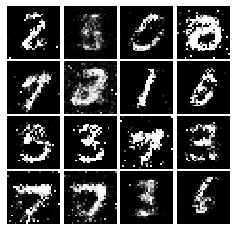

Epoch: 7, Iter: 3400, D: 1.247, G:0.7855


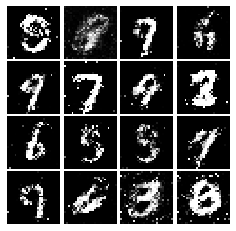

Epoch: 7, Iter: 3420, D: 1.301, G:0.8187


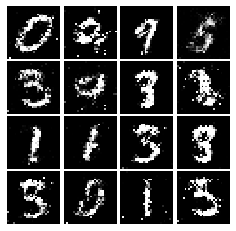

Epoch: 7, Iter: 3440, D: 1.265, G:0.8693


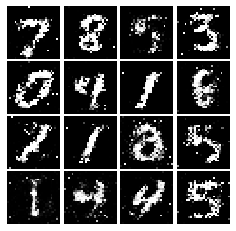

Epoch: 7, Iter: 3460, D: 1.298, G:0.7959


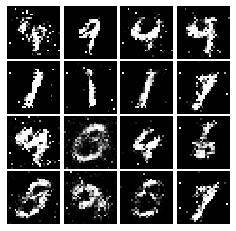

Epoch: 7, Iter: 3480, D: 1.261, G:0.7926


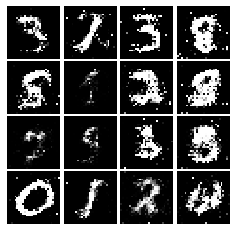

Epoch: 7, Iter: 3500, D: 1.41, G:0.8022


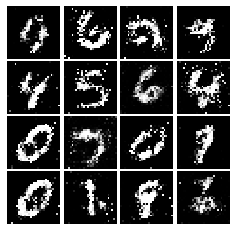

Epoch: 7, Iter: 3520, D: 1.336, G:0.8235


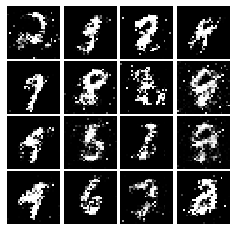

Epoch: 7, Iter: 3540, D: 1.225, G:0.7392


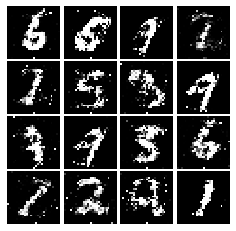

Epoch: 7, Iter: 3560, D: 1.36, G:0.8256


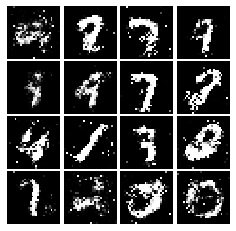

Epoch: 7, Iter: 3580, D: 1.403, G:0.8024


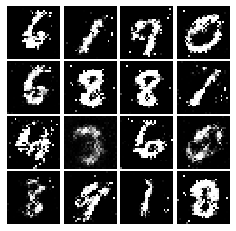

Epoch: 7, Iter: 3600, D: 1.264, G:0.8144


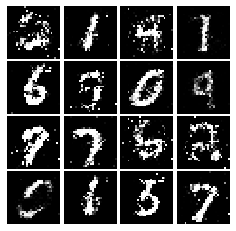

Epoch: 7, Iter: 3620, D: 1.371, G:0.8365


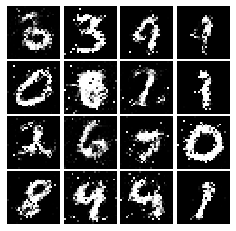

Epoch: 7, Iter: 3640, D: 1.388, G:0.8451


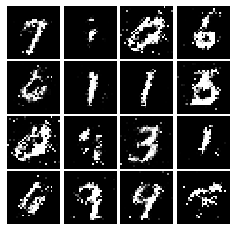

Epoch: 7, Iter: 3660, D: 1.398, G:0.8143


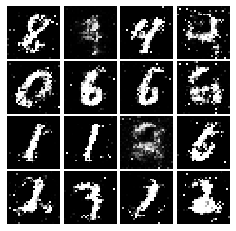

Epoch: 7, Iter: 3680, D: 1.364, G:0.8046


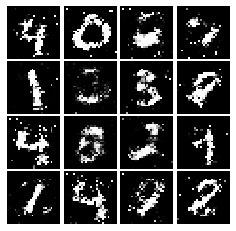

Epoch: 7, Iter: 3700, D: 1.304, G:0.8438


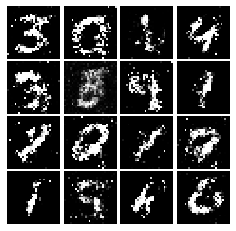

Epoch: 7, Iter: 3720, D: 1.284, G:0.7593


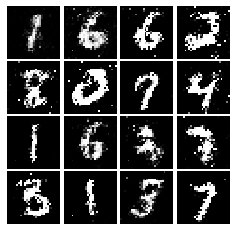

Epoch: 7, Iter: 3740, D: 1.472, G:0.7287


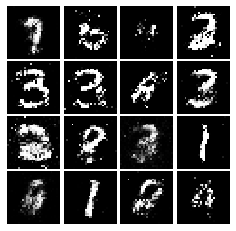

Epoch: 8, Iter: 3760, D: 1.322, G:0.7825


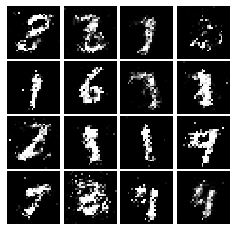

Epoch: 8, Iter: 3780, D: 1.291, G:0.7895


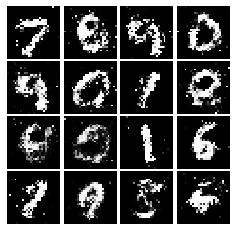

Epoch: 8, Iter: 3800, D: 1.251, G:0.7438


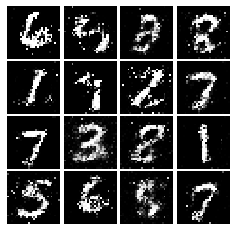

Epoch: 8, Iter: 3820, D: 1.328, G:0.8492


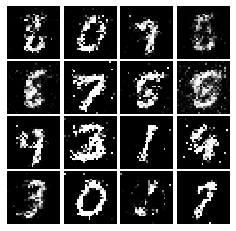

Epoch: 8, Iter: 3840, D: 1.34, G:0.8833


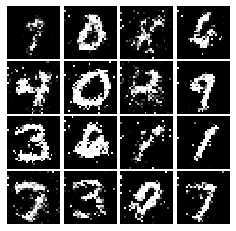

Epoch: 8, Iter: 3860, D: 1.427, G:0.7598


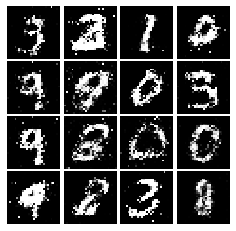

Epoch: 8, Iter: 3880, D: 1.297, G:0.7994


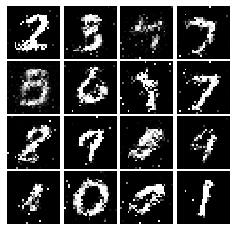

Epoch: 8, Iter: 3900, D: 1.376, G:0.9372


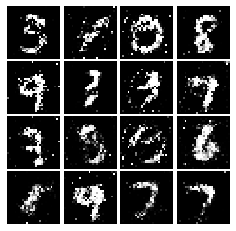

Epoch: 8, Iter: 3920, D: 1.285, G:0.7856


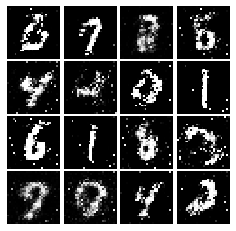

Epoch: 8, Iter: 3940, D: 1.309, G:0.8447


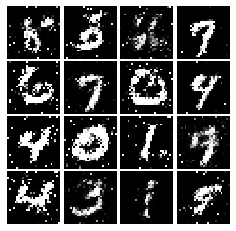

Epoch: 8, Iter: 3960, D: 1.325, G:0.9262


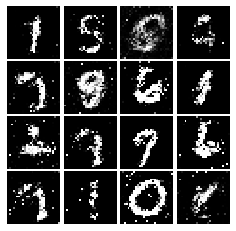

Epoch: 8, Iter: 3980, D: 1.261, G:0.8322


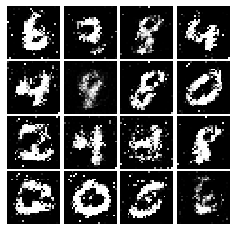

Epoch: 8, Iter: 4000, D: 1.276, G:0.7894


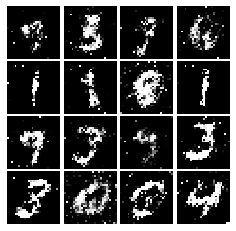

Epoch: 8, Iter: 4020, D: 1.283, G:0.7373


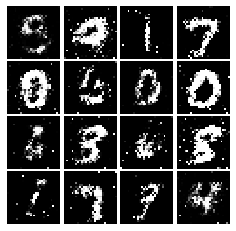

Epoch: 8, Iter: 4040, D: 1.346, G:0.7633


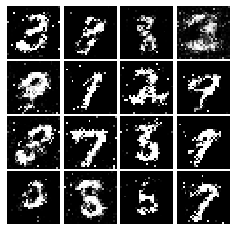

Epoch: 8, Iter: 4060, D: 1.334, G:0.7965


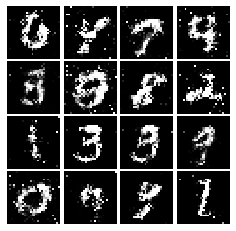

Epoch: 8, Iter: 4080, D: 1.368, G:0.7902


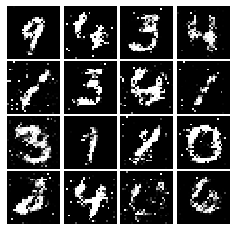

Epoch: 8, Iter: 4100, D: 1.373, G:0.7614


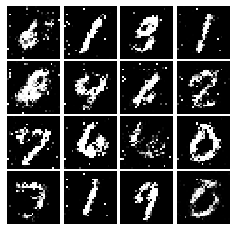

Epoch: 8, Iter: 4120, D: 1.303, G:0.7522


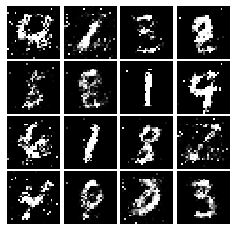

Epoch: 8, Iter: 4140, D: 1.343, G:0.9012


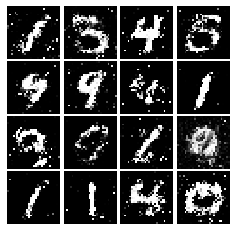

Epoch: 8, Iter: 4160, D: 1.288, G:0.7953


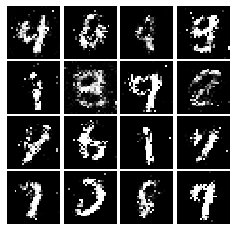

Epoch: 8, Iter: 4180, D: 1.294, G:0.7991


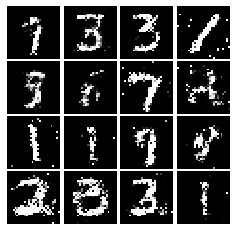

Epoch: 8, Iter: 4200, D: 1.31, G:0.772


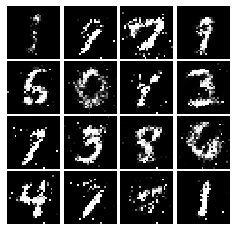

Epoch: 8, Iter: 4220, D: 1.341, G:0.9268


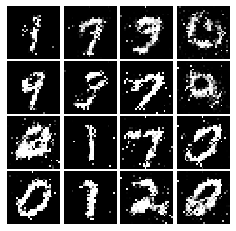

Epoch: 9, Iter: 4240, D: 1.354, G:0.9296


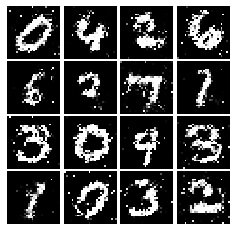

Epoch: 9, Iter: 4260, D: 1.368, G:0.8245


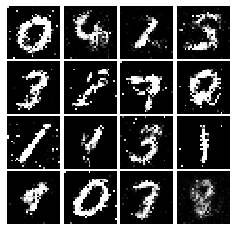

Epoch: 9, Iter: 4280, D: 1.352, G:0.8142


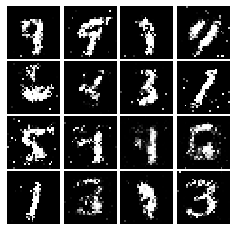

Epoch: 9, Iter: 4300, D: 1.412, G:0.9114


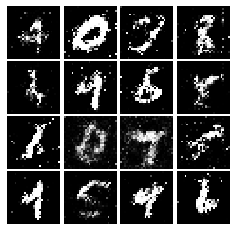

Epoch: 9, Iter: 4320, D: 1.356, G:0.7553


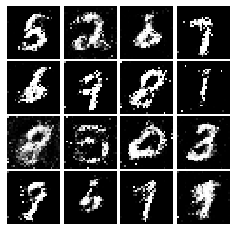

Epoch: 9, Iter: 4340, D: 1.324, G:0.8829


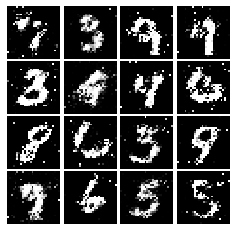

Epoch: 9, Iter: 4360, D: 1.402, G:0.7656


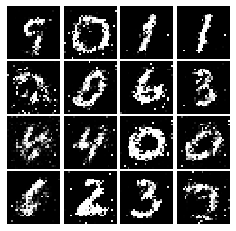

Epoch: 9, Iter: 4380, D: 1.377, G:0.8495


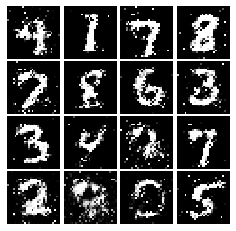

Epoch: 9, Iter: 4400, D: 1.263, G:0.9187


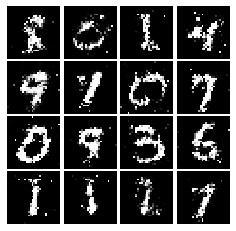

Epoch: 9, Iter: 4420, D: 1.281, G:0.7674


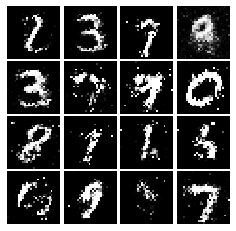

Epoch: 9, Iter: 4440, D: 1.305, G:0.7218


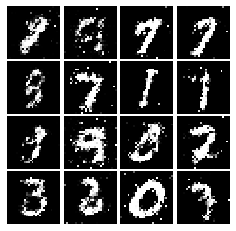

Epoch: 9, Iter: 4460, D: 1.347, G:0.7519


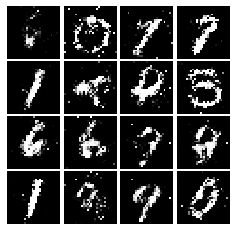

Epoch: 9, Iter: 4480, D: 1.351, G:0.8693


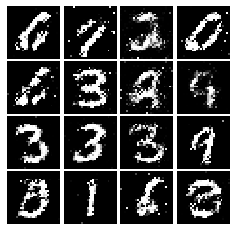

Epoch: 9, Iter: 4500, D: 1.385, G:0.8987


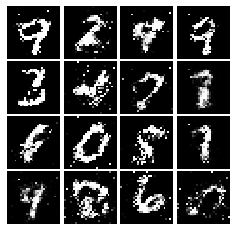

Epoch: 9, Iter: 4520, D: 1.367, G:0.8801


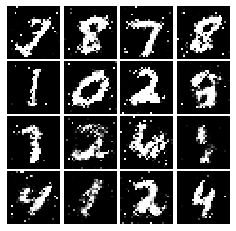

Epoch: 9, Iter: 4540, D: 1.405, G:0.7843


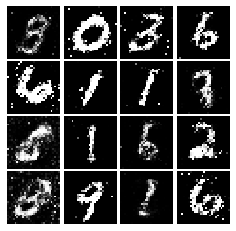

Epoch: 9, Iter: 4560, D: 1.306, G:0.8718


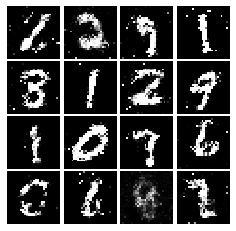

Epoch: 9, Iter: 4580, D: 1.322, G:0.7951


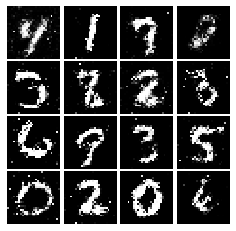

Epoch: 9, Iter: 4600, D: 1.389, G:0.8249


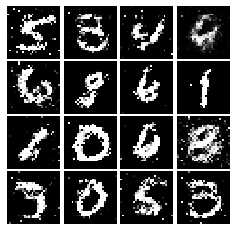

Epoch: 9, Iter: 4620, D: 1.317, G:0.7411


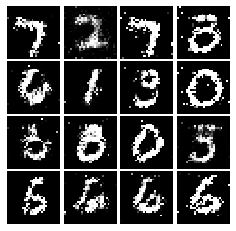

Epoch: 9, Iter: 4640, D: 1.439, G:0.8195


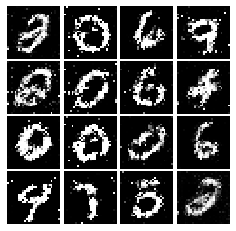

Epoch: 9, Iter: 4660, D: 1.369, G:0.9707


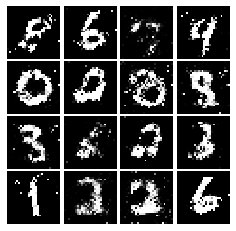

Epoch: 9, Iter: 4680, D: 1.327, G:0.8192


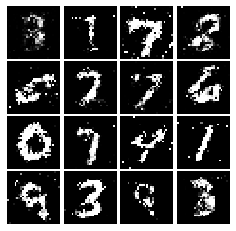

Final images


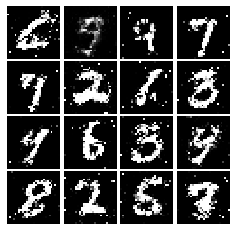

In [18]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [19]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    loss = 0.5 * tf.reduce_mean(tf.square(scores_real - 1)) + 0.5 * tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - 1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [20]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.8608, G:0.3056


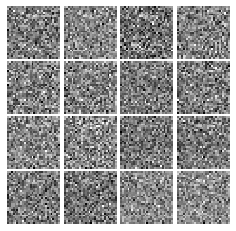

Epoch: 0, Iter: 20, D: 0.09239, G:2.273


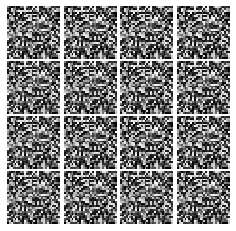

Epoch: 0, Iter: 40, D: 0.0554, G:0.5386


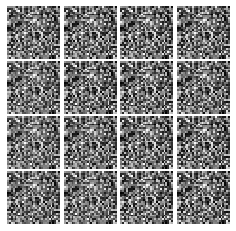

Epoch: 0, Iter: 60, D: 0.1115, G:0.567


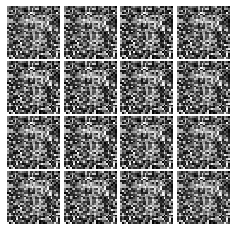

Epoch: 0, Iter: 80, D: 0.2769, G:0.4984


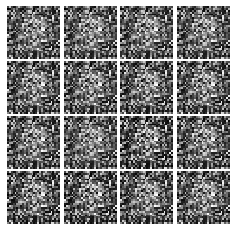

Epoch: 0, Iter: 100, D: 0.0325, G:0.5945


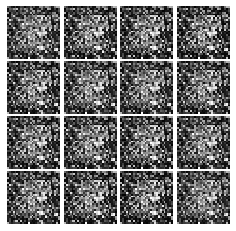

Epoch: 0, Iter: 120, D: 0.01131, G:0.6671


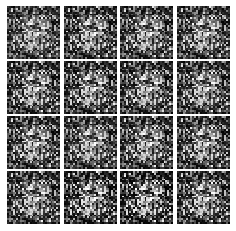

Epoch: 0, Iter: 140, D: 0.02145, G:0.4874


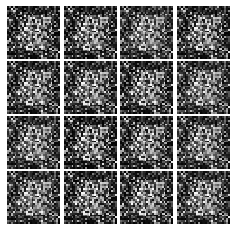

Epoch: 0, Iter: 160, D: 1.178, G:0.3821


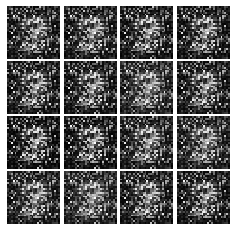

Epoch: 0, Iter: 180, D: 0.01527, G:0.7259


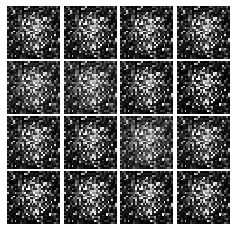

Epoch: 0, Iter: 200, D: 0.2301, G:0.4534


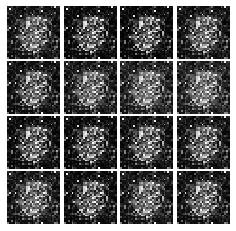

Epoch: 0, Iter: 220, D: 0.3317, G:0.2022


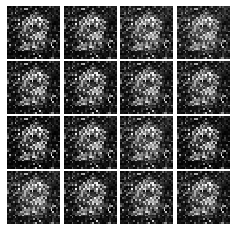

Epoch: 0, Iter: 240, D: 0.1515, G:0.5773


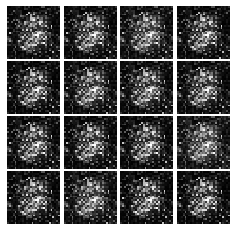

Epoch: 0, Iter: 260, D: 0.1275, G:0.6246


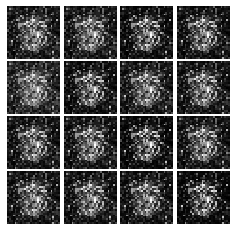

Epoch: 0, Iter: 280, D: 0.1263, G:0.623


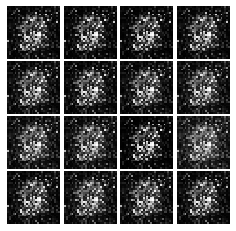

Epoch: 0, Iter: 300, D: 0.1711, G:0.589


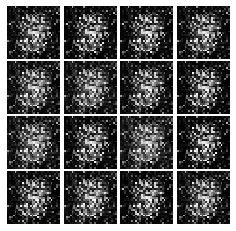

Epoch: 0, Iter: 320, D: 0.1302, G:0.4549


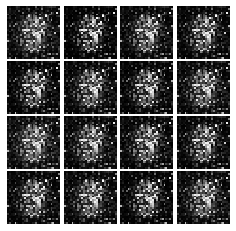

Epoch: 0, Iter: 340, D: 0.1433, G:0.3383


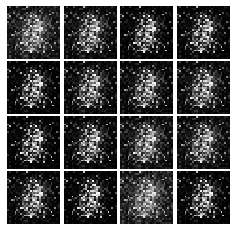

Epoch: 0, Iter: 360, D: 0.177, G:0.4659


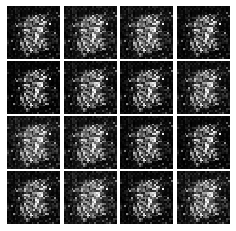

Epoch: 0, Iter: 380, D: 0.08126, G:0.7475


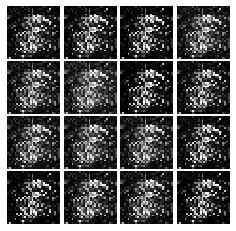

Epoch: 0, Iter: 400, D: 0.06562, G:0.3474


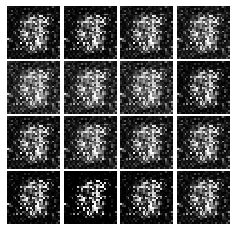

Epoch: 0, Iter: 420, D: 0.109, G:0.3523


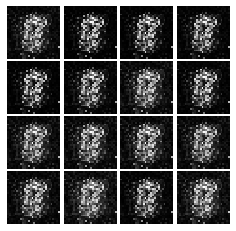

Epoch: 0, Iter: 440, D: 0.06778, G:0.7934


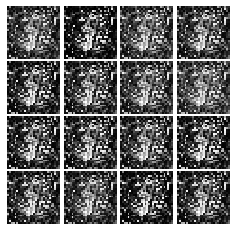

Epoch: 0, Iter: 460, D: 0.2025, G:0.362


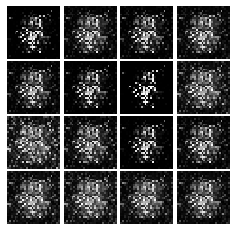

Epoch: 1, Iter: 480, D: 0.1748, G:0.5531


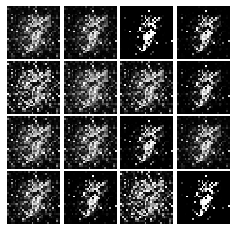

Epoch: 1, Iter: 500, D: 0.3485, G:1.09


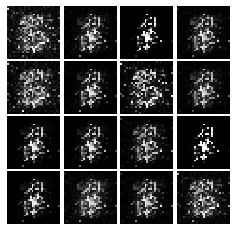

Epoch: 1, Iter: 520, D: 0.1037, G:0.5019


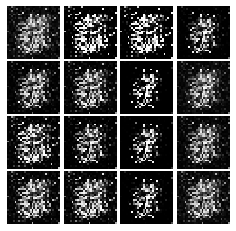

Epoch: 1, Iter: 540, D: 0.1032, G:0.6282


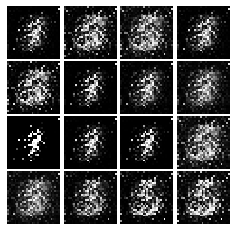

Epoch: 1, Iter: 560, D: 0.146, G:0.3745


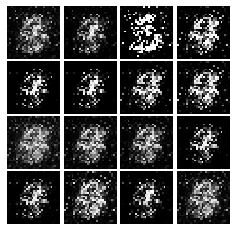

Epoch: 1, Iter: 580, D: 0.165, G:0.4192


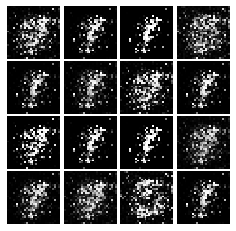

Epoch: 1, Iter: 600, D: 0.216, G:0.4888


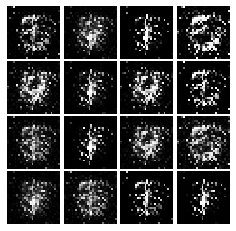

Epoch: 1, Iter: 620, D: 0.08398, G:0.407


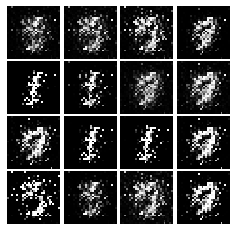

Epoch: 1, Iter: 640, D: 0.05138, G:0.4222


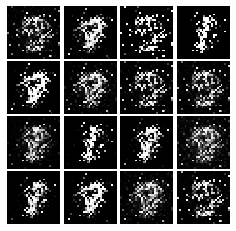

Epoch: 1, Iter: 660, D: 0.1198, G:0.3211


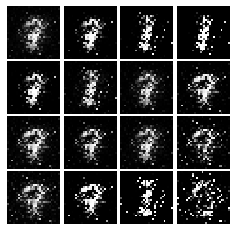

Epoch: 1, Iter: 680, D: 0.114, G:0.2891


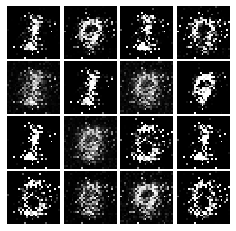

Epoch: 1, Iter: 700, D: 0.1492, G:0.3912


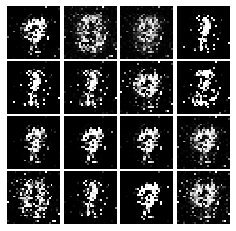

Epoch: 1, Iter: 720, D: 0.08983, G:0.3698


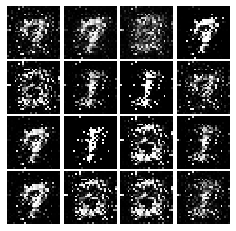

Epoch: 1, Iter: 740, D: 0.154, G:0.5202


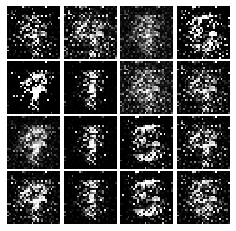

Epoch: 1, Iter: 760, D: 0.1905, G:0.2645


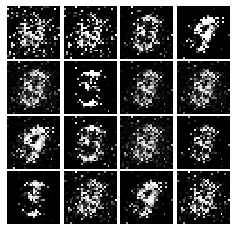

Epoch: 1, Iter: 780, D: 0.1403, G:0.4905


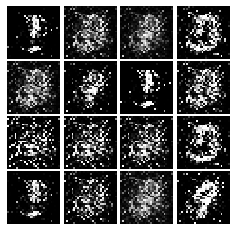

Epoch: 1, Iter: 800, D: 0.1744, G:0.2589


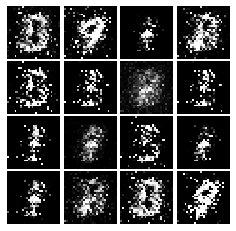

Epoch: 1, Iter: 820, D: 0.2356, G:0.182


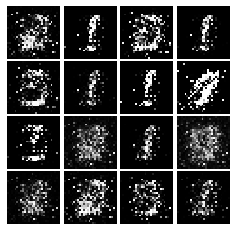

Epoch: 1, Iter: 840, D: 0.1261, G:0.3594


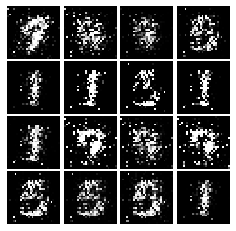

Epoch: 1, Iter: 860, D: 0.1975, G:0.2345


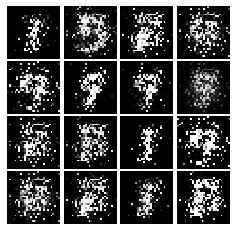

Epoch: 1, Iter: 880, D: 0.2753, G:0.3182


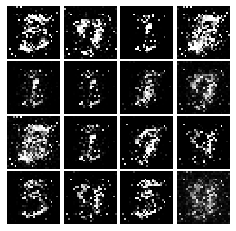

Epoch: 1, Iter: 900, D: 0.1825, G:0.2737


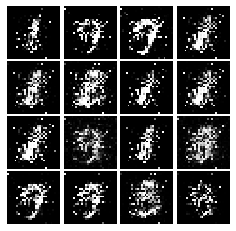

Epoch: 1, Iter: 920, D: 0.5836, G:0.08081


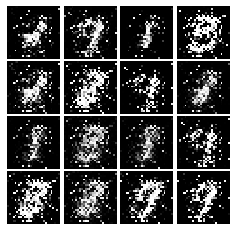

Epoch: 2, Iter: 940, D: 0.1848, G:0.2632


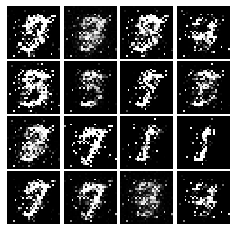

Epoch: 2, Iter: 960, D: 0.2835, G:0.01948


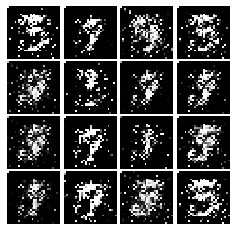

Epoch: 2, Iter: 980, D: 0.2172, G:0.259


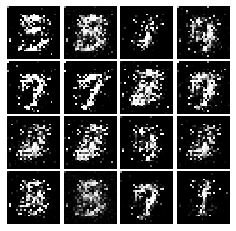

Epoch: 2, Iter: 1000, D: 0.181, G:0.2812


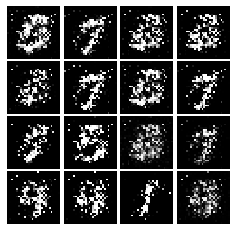

Epoch: 2, Iter: 1020, D: 0.1498, G:0.4568


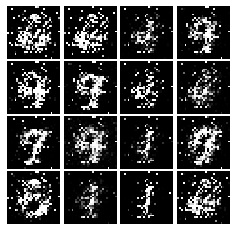

Epoch: 2, Iter: 1040, D: 0.1264, G:0.3702


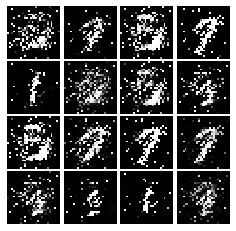

Epoch: 2, Iter: 1060, D: 0.1328, G:0.4518


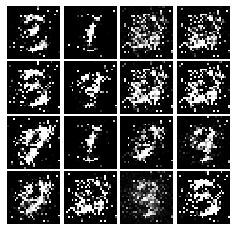

Epoch: 2, Iter: 1080, D: 0.11, G:0.4098


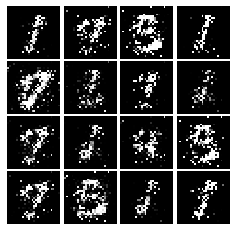

Epoch: 2, Iter: 1100, D: 0.09998, G:0.3438


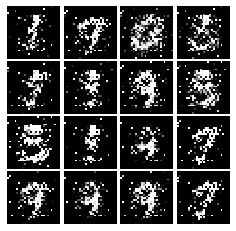

Epoch: 2, Iter: 1120, D: 0.1313, G:0.2961


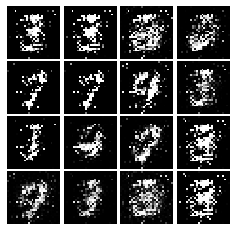

Epoch: 2, Iter: 1140, D: 0.1117, G:0.7816


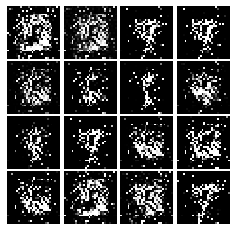

Epoch: 2, Iter: 1160, D: 0.1108, G:0.3764


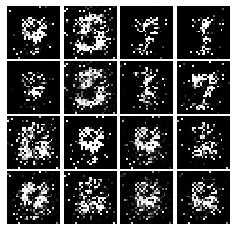

Epoch: 2, Iter: 1180, D: 0.299, G:0.2693


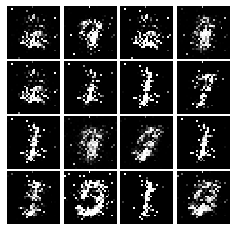

Epoch: 2, Iter: 1200, D: 0.139, G:0.3342


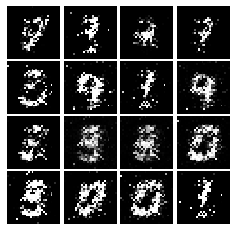

Epoch: 2, Iter: 1220, D: 0.1221, G:0.4281


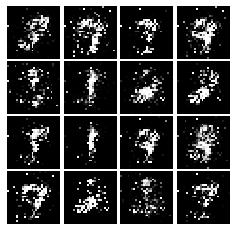

Epoch: 2, Iter: 1240, D: 0.1519, G:0.369


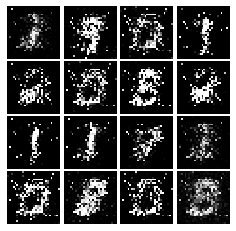

Epoch: 2, Iter: 1260, D: 0.2599, G:0.339


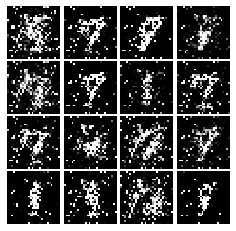

Epoch: 2, Iter: 1280, D: 0.1496, G:0.3276


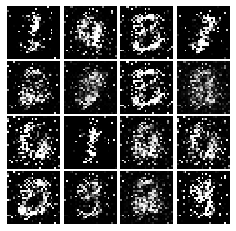

Epoch: 2, Iter: 1300, D: 0.1603, G:0.5911


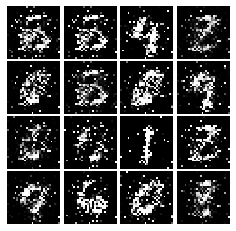

Epoch: 2, Iter: 1320, D: 0.1882, G:0.295


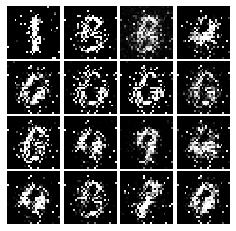

Epoch: 2, Iter: 1340, D: 0.1685, G:0.2277


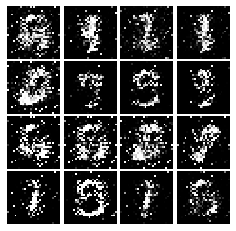

Epoch: 2, Iter: 1360, D: 0.1832, G:0.3128


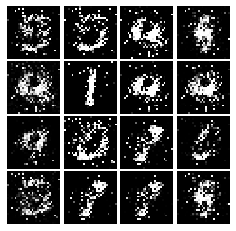

Epoch: 2, Iter: 1380, D: 0.1839, G:0.3868


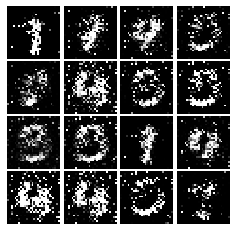

Epoch: 2, Iter: 1400, D: 0.144, G:0.2929


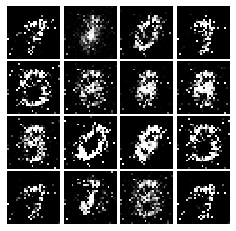

Epoch: 3, Iter: 1420, D: 0.2462, G:0.7427


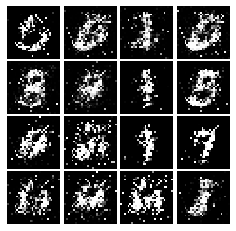

Epoch: 3, Iter: 1440, D: 0.1212, G:0.3562


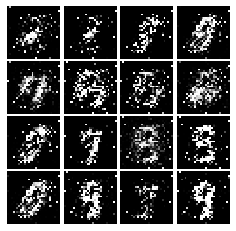

Epoch: 3, Iter: 1460, D: 0.1935, G:0.3717


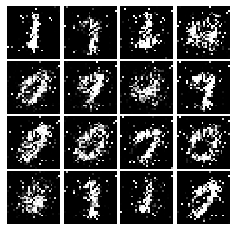

Epoch: 3, Iter: 1480, D: 0.172, G:0.3206


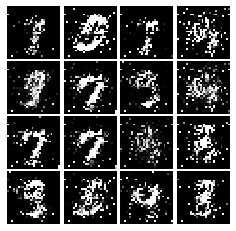

Epoch: 3, Iter: 1500, D: 0.1651, G:0.2864


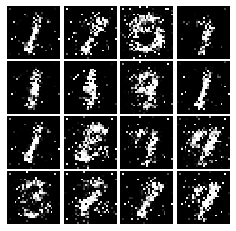

Epoch: 3, Iter: 1520, D: 0.1593, G:0.3332


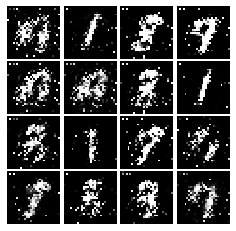

Epoch: 3, Iter: 1540, D: 0.1651, G:0.257


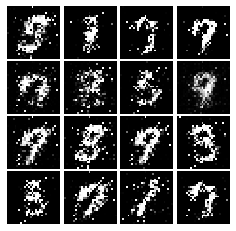

Epoch: 3, Iter: 1560, D: 0.1513, G:0.4511


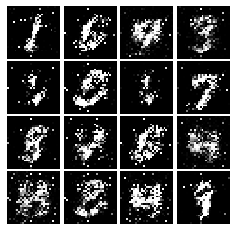

Epoch: 3, Iter: 1580, D: 0.1663, G:0.2814


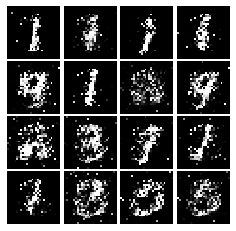

Epoch: 3, Iter: 1600, D: 0.1584, G:0.1934


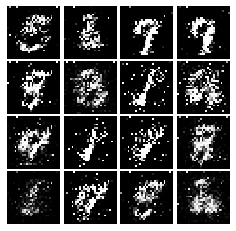

Epoch: 3, Iter: 1620, D: 0.1645, G:0.2233


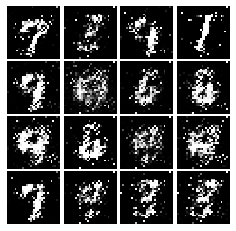

Epoch: 3, Iter: 1640, D: 0.1538, G:0.303


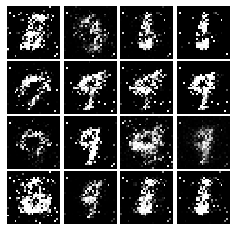

Epoch: 3, Iter: 1660, D: 0.1705, G:0.4496


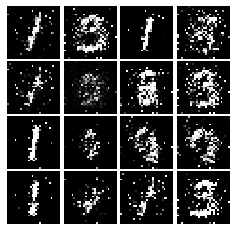

Epoch: 3, Iter: 1680, D: 0.188, G:0.2543


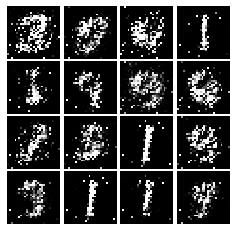

Epoch: 3, Iter: 1700, D: 0.2213, G:0.2182


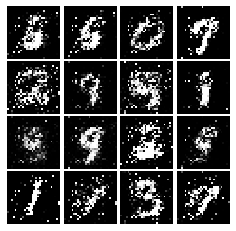

Epoch: 3, Iter: 1720, D: 0.1712, G:0.3062


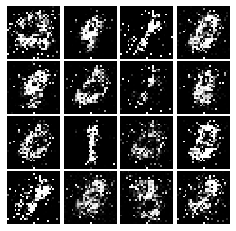

Epoch: 3, Iter: 1740, D: 0.1978, G:0.1846


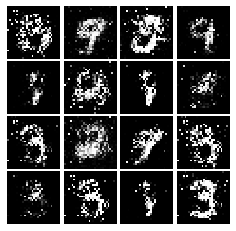

Epoch: 3, Iter: 1760, D: 0.1797, G:0.2422


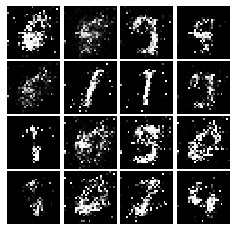

Epoch: 3, Iter: 1780, D: 0.2172, G:0.2788


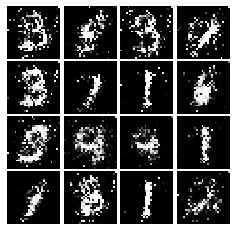

Epoch: 3, Iter: 1800, D: 0.2003, G:0.2485


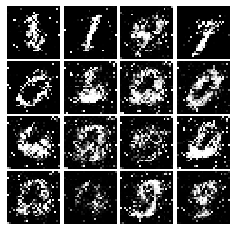

Epoch: 3, Iter: 1820, D: 0.2119, G:0.2461


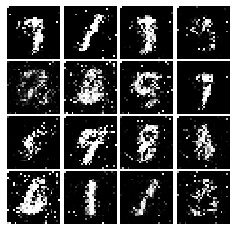

Epoch: 3, Iter: 1840, D: 0.2274, G:0.2267


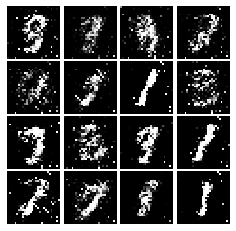

Epoch: 3, Iter: 1860, D: 0.2029, G:0.2135


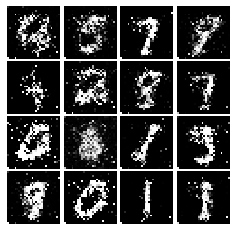

Epoch: 4, Iter: 1880, D: 0.2129, G:0.1719


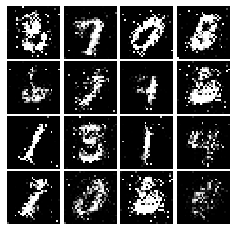

Epoch: 4, Iter: 1900, D: 0.2069, G:0.2481


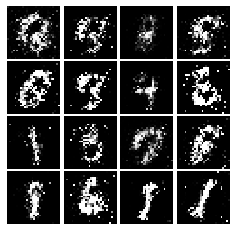

Epoch: 4, Iter: 1920, D: 0.2106, G:0.2017


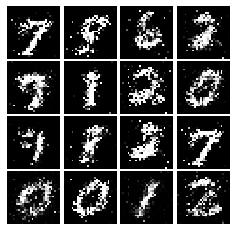

Epoch: 4, Iter: 1940, D: 0.2316, G:0.1949


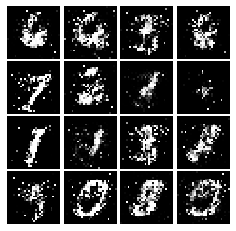

Epoch: 4, Iter: 1960, D: 0.2524, G:0.2111


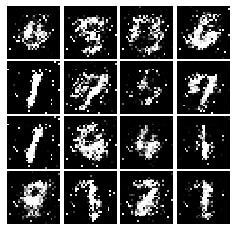

Epoch: 4, Iter: 1980, D: 0.2243, G:0.2131


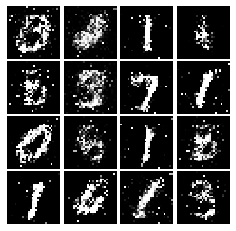

Epoch: 4, Iter: 2000, D: 0.1946, G:0.2465


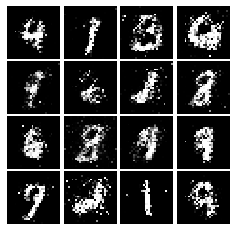

Epoch: 4, Iter: 2020, D: 0.2235, G:0.1989


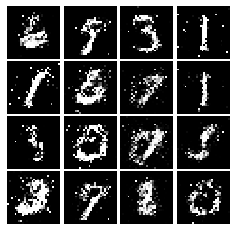

Epoch: 4, Iter: 2040, D: 0.198, G:0.2411


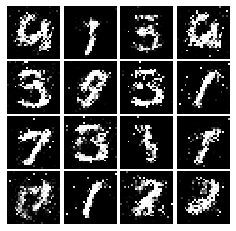

Epoch: 4, Iter: 2060, D: 0.2195, G:0.1905


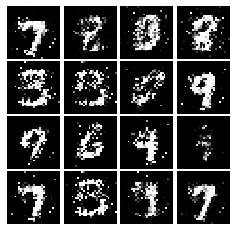

Epoch: 4, Iter: 2080, D: 0.2002, G:0.1991


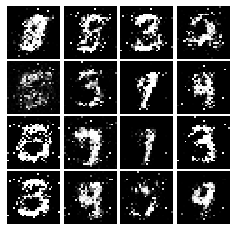

Epoch: 4, Iter: 2100, D: 0.2088, G:0.1866


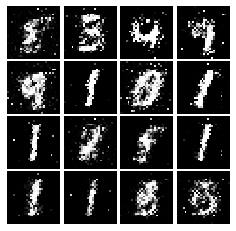

Epoch: 4, Iter: 2120, D: 0.2499, G:0.1917


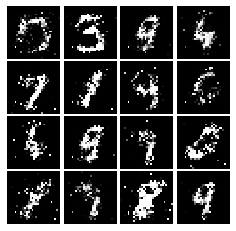

Epoch: 4, Iter: 2140, D: 0.2441, G:0.1033


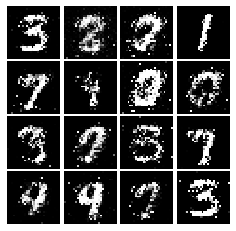

Epoch: 4, Iter: 2160, D: 0.2248, G:0.2084


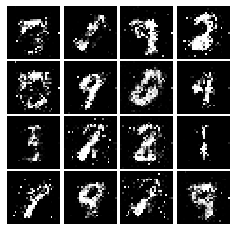

Epoch: 4, Iter: 2180, D: 0.2162, G:0.2297


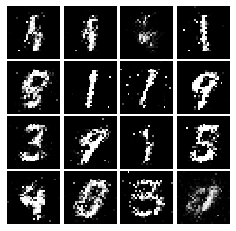

Epoch: 4, Iter: 2200, D: 0.2393, G:0.1932


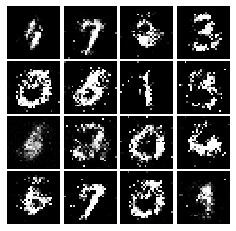

Epoch: 4, Iter: 2220, D: 0.2613, G:0.1917


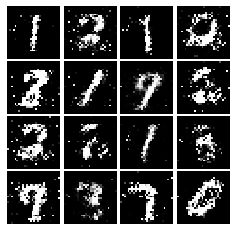

Epoch: 4, Iter: 2240, D: 0.2111, G:0.152


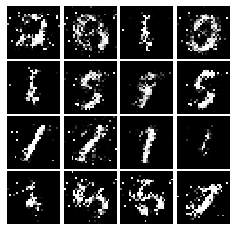

Epoch: 4, Iter: 2260, D: 0.2248, G:0.1957


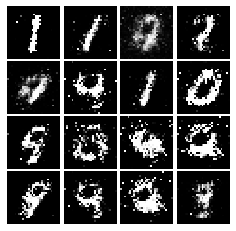

Epoch: 4, Iter: 2280, D: 0.2219, G:0.1996


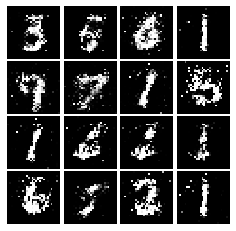

Epoch: 4, Iter: 2300, D: 0.194, G:0.3003


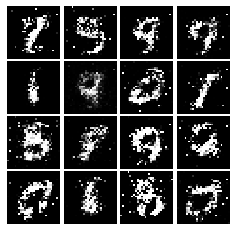

Epoch: 4, Iter: 2320, D: 0.2083, G:0.2622


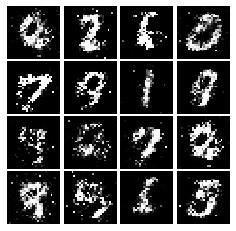

Epoch: 4, Iter: 2340, D: 0.2044, G:0.2435


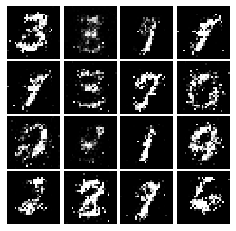

Epoch: 5, Iter: 2360, D: 0.2088, G:0.181


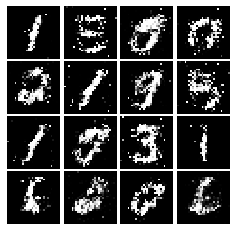

Epoch: 5, Iter: 2380, D: 0.2021, G:0.2588


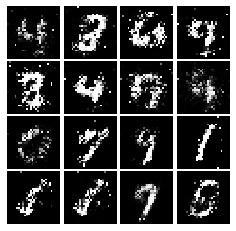

Epoch: 5, Iter: 2400, D: 0.2081, G:0.2975


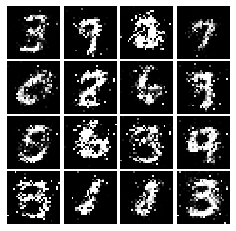

Epoch: 5, Iter: 2420, D: 0.2348, G:0.2066


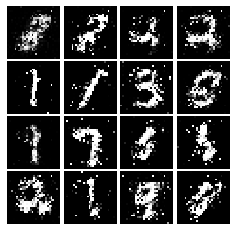

Epoch: 5, Iter: 2440, D: 0.2168, G:0.2464


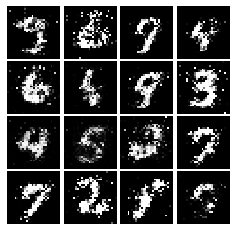

Epoch: 5, Iter: 2460, D: 0.1828, G:0.255


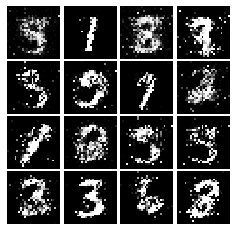

Epoch: 5, Iter: 2480, D: 0.2168, G:0.1894


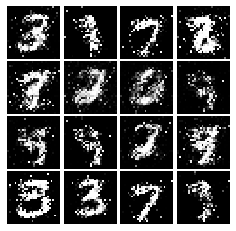

Epoch: 5, Iter: 2500, D: 0.1902, G:0.218


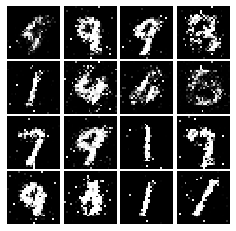

Epoch: 5, Iter: 2520, D: 0.245, G:0.2331


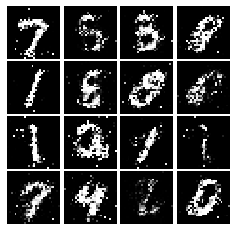

Epoch: 5, Iter: 2540, D: 0.2239, G:0.1657


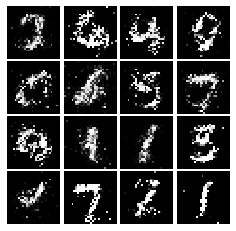

Epoch: 5, Iter: 2560, D: 0.2471, G:0.1541


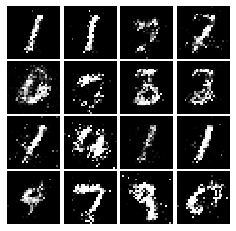

Epoch: 5, Iter: 2580, D: 0.2083, G:0.2238


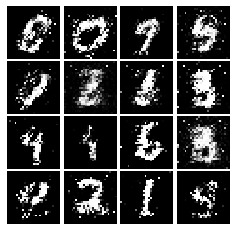

Epoch: 5, Iter: 2600, D: 0.2342, G:0.1636


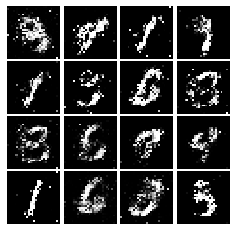

Epoch: 5, Iter: 2620, D: 0.2062, G:0.1859


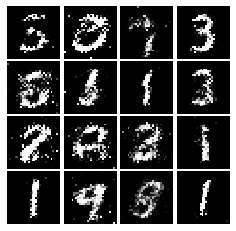

Epoch: 5, Iter: 2640, D: 0.2255, G:0.1644


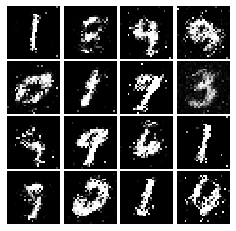

Epoch: 5, Iter: 2660, D: 0.2005, G:0.2025


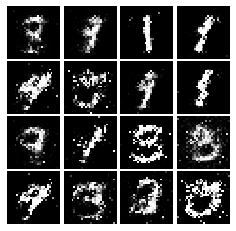

Epoch: 5, Iter: 2680, D: 0.2445, G:0.1624


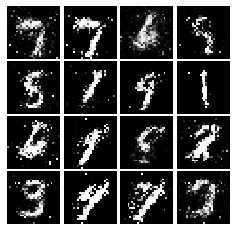

Epoch: 5, Iter: 2700, D: 0.2225, G:0.2575


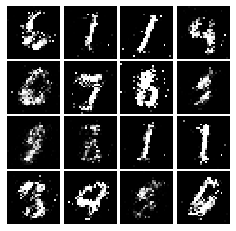

Epoch: 5, Iter: 2720, D: 0.2023, G:0.1924


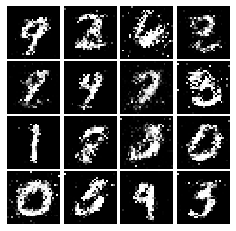

Epoch: 5, Iter: 2740, D: 0.2003, G:0.1936


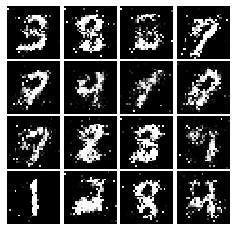

Epoch: 5, Iter: 2760, D: 0.2254, G:0.1659


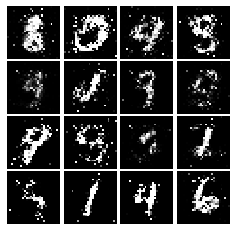

Epoch: 5, Iter: 2780, D: 0.2187, G:0.199


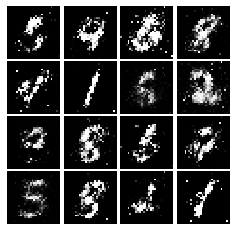

Epoch: 5, Iter: 2800, D: 0.2147, G:0.1792


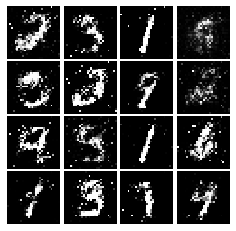

Epoch: 6, Iter: 2820, D: 0.2185, G:0.1722


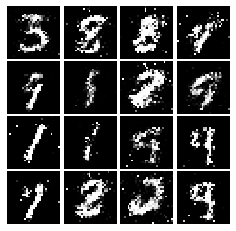

Epoch: 6, Iter: 2840, D: 0.2079, G:0.1772


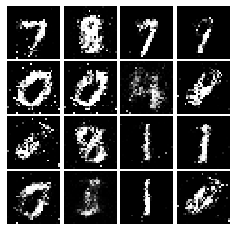

Epoch: 6, Iter: 2860, D: 0.2163, G:0.1914


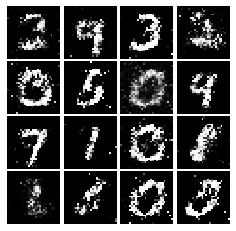

Epoch: 6, Iter: 2880, D: 0.228, G:0.203


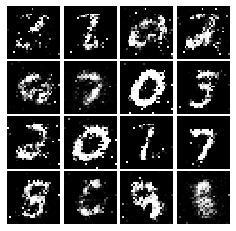

Epoch: 6, Iter: 2900, D: 0.2176, G:0.2034


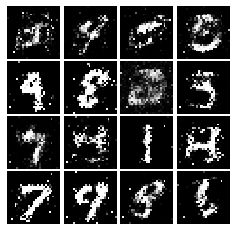

Epoch: 6, Iter: 2920, D: 0.2326, G:0.1533


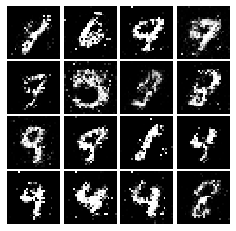

Epoch: 6, Iter: 2940, D: 0.2267, G:0.1789


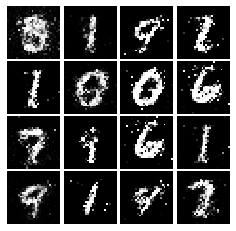

Epoch: 6, Iter: 2960, D: 0.2155, G:0.1977


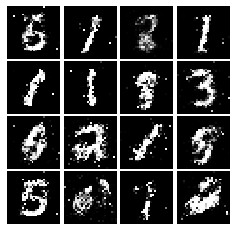

Epoch: 6, Iter: 2980, D: 0.216, G:0.181


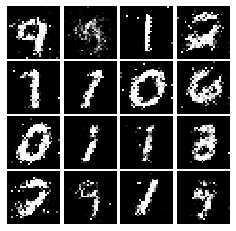

Epoch: 6, Iter: 3000, D: 0.2301, G:0.1706


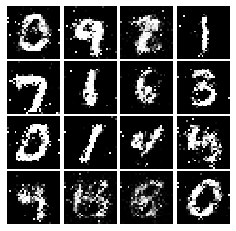

Epoch: 6, Iter: 3020, D: 0.2217, G:0.1666


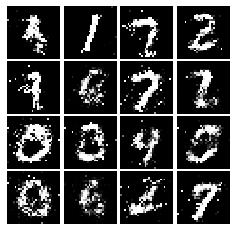

Epoch: 6, Iter: 3040, D: 0.2211, G:0.1801


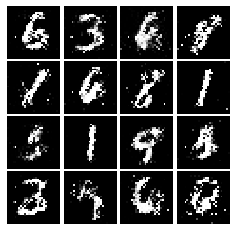

Epoch: 6, Iter: 3060, D: 0.2219, G:0.1512


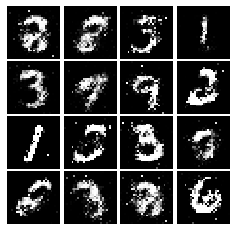

Epoch: 6, Iter: 3080, D: 0.2288, G:0.1746


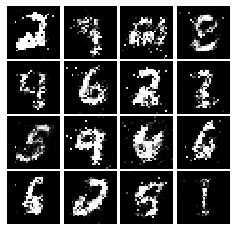

Epoch: 6, Iter: 3100, D: 0.2209, G:0.1918


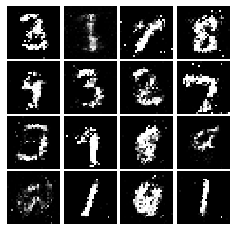

Epoch: 6, Iter: 3120, D: 0.2237, G:0.1872


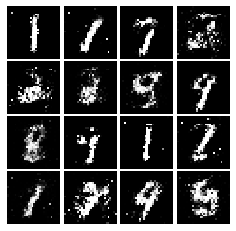

Epoch: 6, Iter: 3140, D: 0.2268, G:0.1734


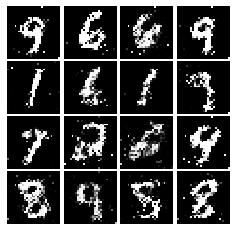

Epoch: 6, Iter: 3160, D: 0.1974, G:0.2088


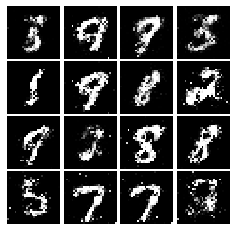

Epoch: 6, Iter: 3180, D: 0.1986, G:0.178


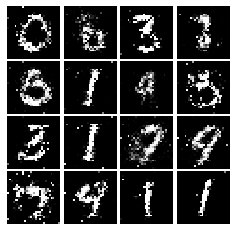

Epoch: 6, Iter: 3200, D: 0.2475, G:0.1826


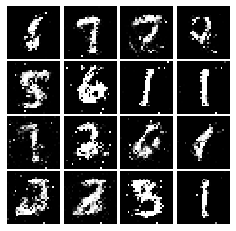

Epoch: 6, Iter: 3220, D: 0.2108, G:0.1381


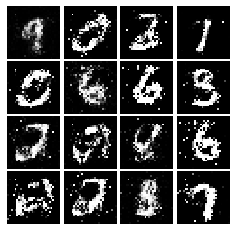

Epoch: 6, Iter: 3240, D: 0.1986, G:0.1929


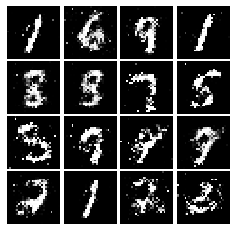

Epoch: 6, Iter: 3260, D: 0.2579, G:0.1793


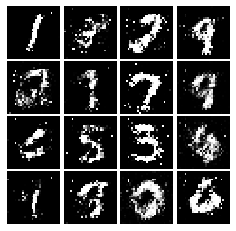

Epoch: 6, Iter: 3280, D: 0.2061, G:0.1672


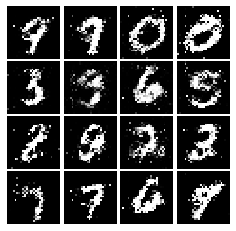

Epoch: 7, Iter: 3300, D: 0.2151, G:0.1838


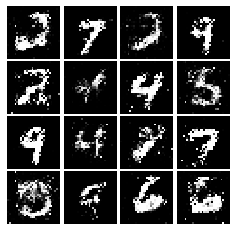

Epoch: 7, Iter: 3320, D: 0.215, G:0.1935


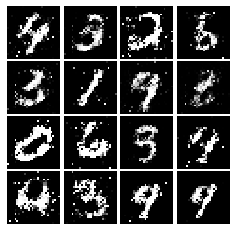

Epoch: 7, Iter: 3340, D: 0.2103, G:0.1848


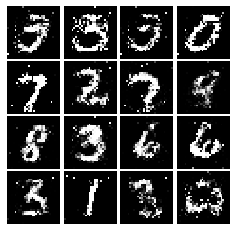

Epoch: 7, Iter: 3360, D: 0.2247, G:0.2097


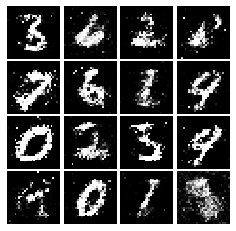

Epoch: 7, Iter: 3380, D: 0.2213, G:0.1774


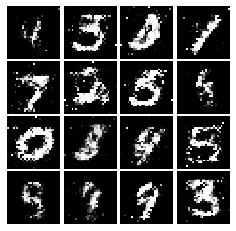

Epoch: 7, Iter: 3400, D: 0.2381, G:0.1922


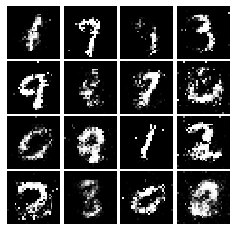

Epoch: 7, Iter: 3420, D: 0.2423, G:0.1553


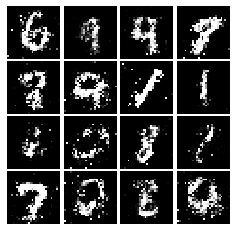

Epoch: 7, Iter: 3440, D: 0.2335, G:0.1957


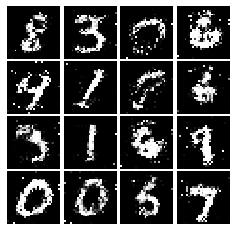

Epoch: 7, Iter: 3460, D: 0.2508, G:0.1837


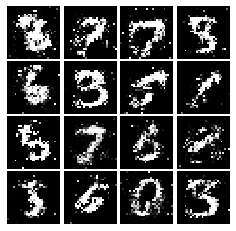

Epoch: 7, Iter: 3480, D: 0.2225, G:0.1979


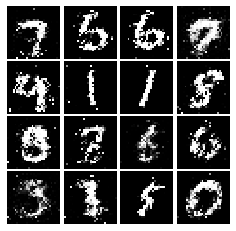

Epoch: 7, Iter: 3500, D: 0.2246, G:0.1787


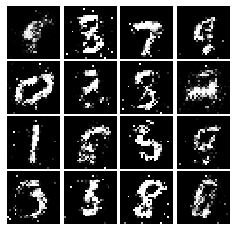

Epoch: 7, Iter: 3520, D: 0.2173, G:0.1482


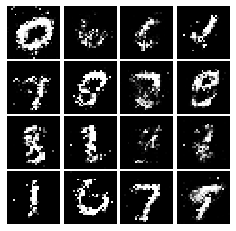

Epoch: 7, Iter: 3540, D: 0.2224, G:0.1655


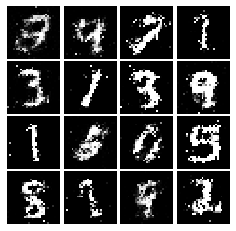

Epoch: 7, Iter: 3560, D: 0.2194, G:0.1767


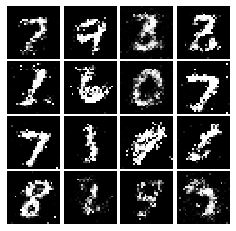

Epoch: 7, Iter: 3580, D: 0.2079, G:0.1611


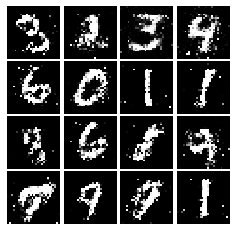

Epoch: 7, Iter: 3600, D: 0.2137, G:0.1834


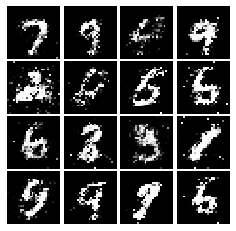

Epoch: 7, Iter: 3620, D: 0.1978, G:0.2195


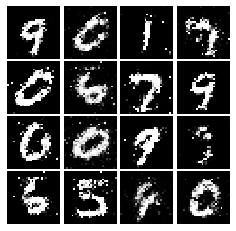

Epoch: 7, Iter: 3640, D: 0.2237, G:0.2191


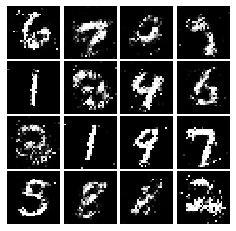

Epoch: 7, Iter: 3660, D: 0.2193, G:0.1815


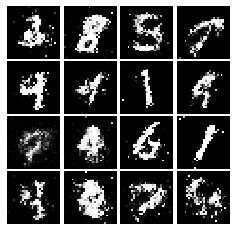

Epoch: 7, Iter: 3680, D: 0.235, G:0.1792


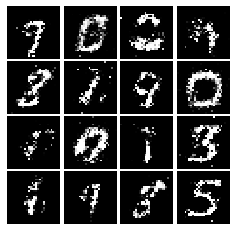

Epoch: 7, Iter: 3700, D: 0.2216, G:0.1808


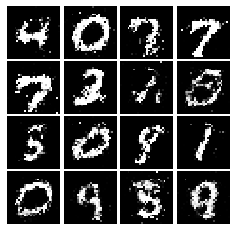

Epoch: 7, Iter: 3720, D: 0.215, G:0.1937


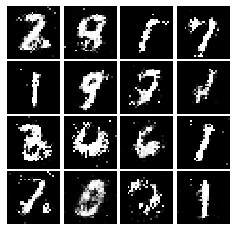

Epoch: 7, Iter: 3740, D: 0.2378, G:0.1759


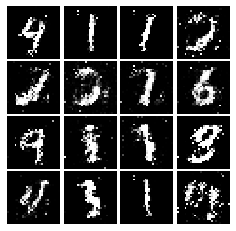

Epoch: 8, Iter: 3760, D: 0.2121, G:0.2316


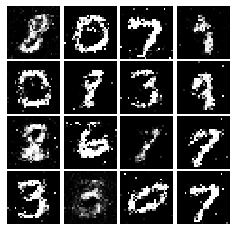

Epoch: 8, Iter: 3780, D: 0.2341, G:0.1778


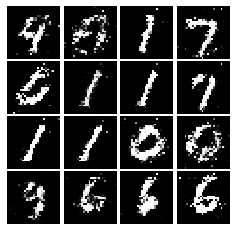

Epoch: 8, Iter: 3800, D: 0.2231, G:0.1708


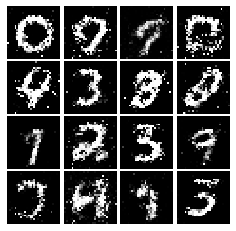

Epoch: 8, Iter: 3820, D: 0.2478, G:0.2035


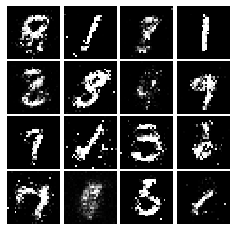

Epoch: 8, Iter: 3840, D: 0.2416, G:0.1619


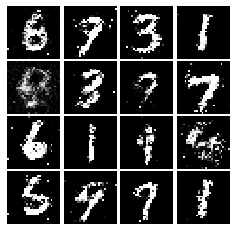

Epoch: 8, Iter: 3860, D: 0.2101, G:0.1431


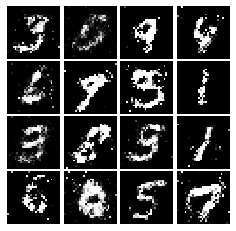

Epoch: 8, Iter: 3880, D: 0.2366, G:0.169


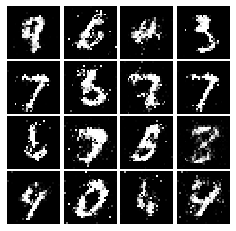

Epoch: 8, Iter: 3900, D: 0.2324, G:0.1814


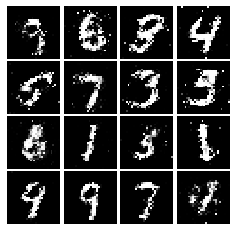

Epoch: 8, Iter: 3920, D: 0.1978, G:0.1734


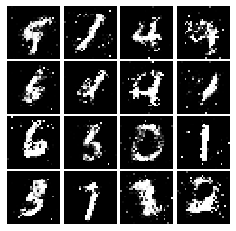

Epoch: 8, Iter: 3940, D: 0.2266, G:0.1772


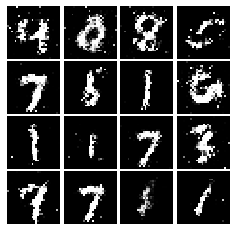

Epoch: 8, Iter: 3960, D: 0.2309, G:0.1551


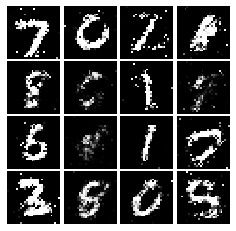

Epoch: 8, Iter: 3980, D: 0.2041, G:0.1794


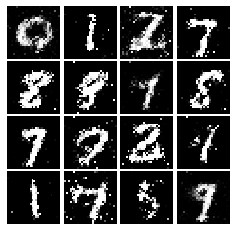

Epoch: 8, Iter: 4000, D: 0.2151, G:0.1573


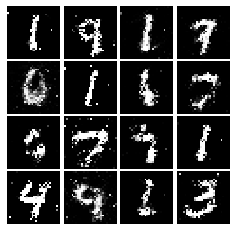

Epoch: 8, Iter: 4020, D: 0.2294, G:0.1865


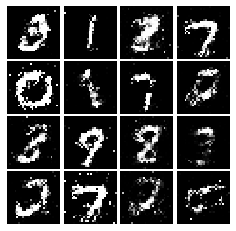

Epoch: 8, Iter: 4040, D: 0.2183, G:0.2021


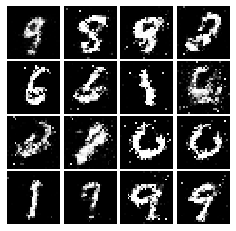

Epoch: 8, Iter: 4060, D: 0.2111, G:0.1774


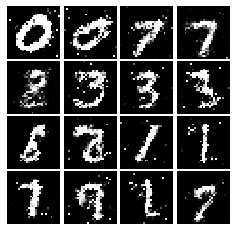

Epoch: 8, Iter: 4080, D: 0.2341, G:0.1795


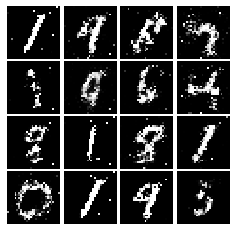

Epoch: 8, Iter: 4100, D: 0.2178, G:0.1573


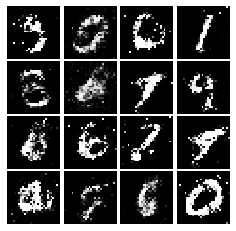

Epoch: 8, Iter: 4120, D: 0.2321, G:0.1795


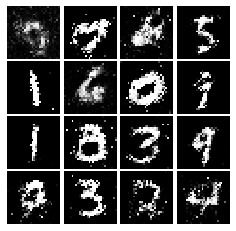

Epoch: 8, Iter: 4140, D: 0.2197, G:0.1647


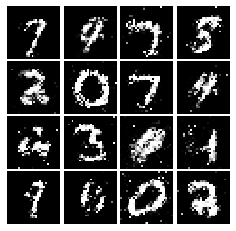

Epoch: 8, Iter: 4160, D: 0.2241, G:0.1697


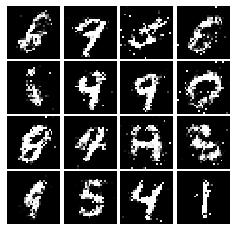

Epoch: 8, Iter: 4180, D: 0.2421, G:0.1688


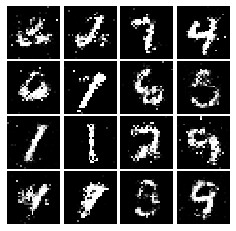

Epoch: 8, Iter: 4200, D: 0.2327, G:0.2196


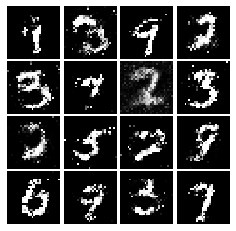

Epoch: 8, Iter: 4220, D: 0.1996, G:0.1965


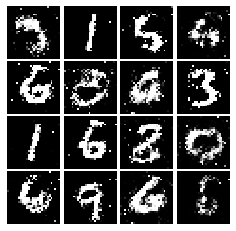

Epoch: 9, Iter: 4240, D: 0.238, G:0.182


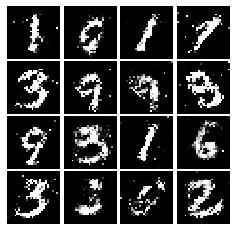

Epoch: 9, Iter: 4260, D: 0.2362, G:0.1627


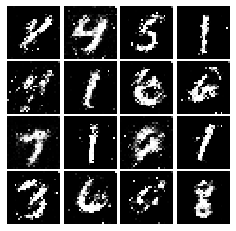

Epoch: 9, Iter: 4280, D: 0.2322, G:0.2066


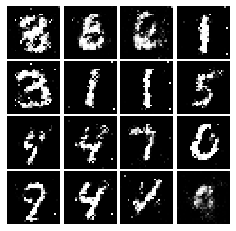

Epoch: 9, Iter: 4300, D: 0.2498, G:0.1728


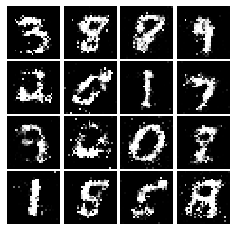

Epoch: 9, Iter: 4320, D: 0.2239, G:0.1812


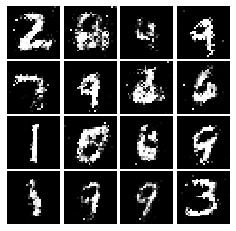

Epoch: 9, Iter: 4340, D: 0.2227, G:0.189


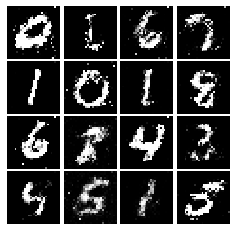

Epoch: 9, Iter: 4360, D: 0.2392, G:0.1491


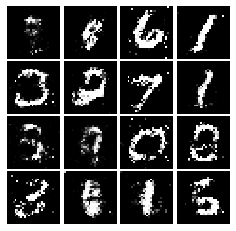

Epoch: 9, Iter: 4380, D: 0.2383, G:0.165


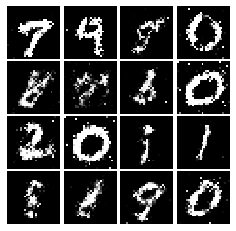

Epoch: 9, Iter: 4400, D: 0.2239, G:0.1834


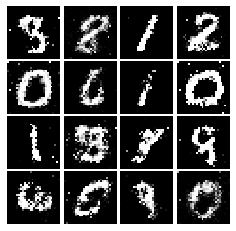

Epoch: 9, Iter: 4420, D: 0.2448, G:0.1407


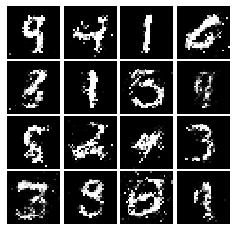

Epoch: 9, Iter: 4440, D: 0.2221, G:0.1603


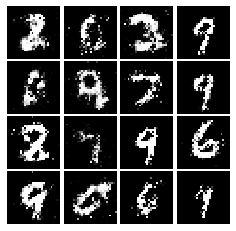

Epoch: 9, Iter: 4460, D: 0.2484, G:0.1512


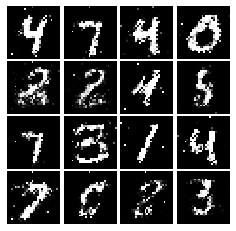

Epoch: 9, Iter: 4480, D: 0.2273, G:0.1769


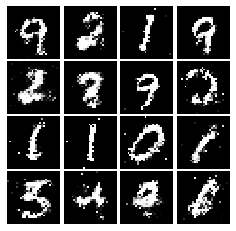

Epoch: 9, Iter: 4500, D: 0.2584, G:0.1773


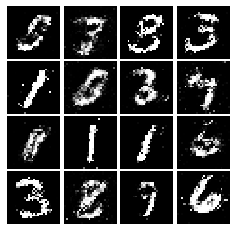

Epoch: 9, Iter: 4520, D: 0.2419, G:0.1716


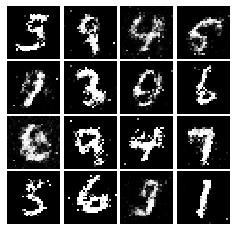

Epoch: 9, Iter: 4540, D: 0.2293, G:0.1716


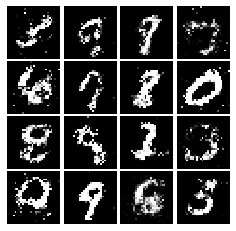

Epoch: 9, Iter: 4560, D: 0.2239, G:0.1736


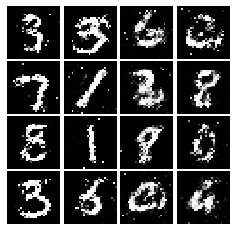

Epoch: 9, Iter: 4580, D: 0.2368, G:0.188


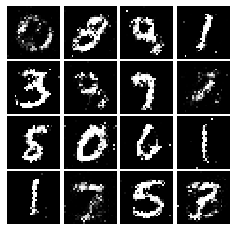

Epoch: 9, Iter: 4600, D: 0.2516, G:0.1419


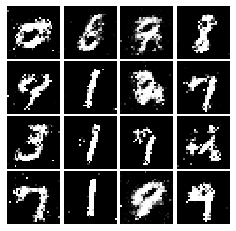

Epoch: 9, Iter: 4620, D: 0.2274, G:0.1861


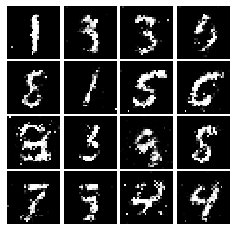

Epoch: 9, Iter: 4640, D: 0.2263, G:0.1873


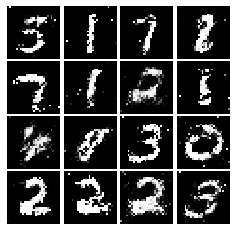

Epoch: 9, Iter: 4660, D: 0.234, G:0.1742


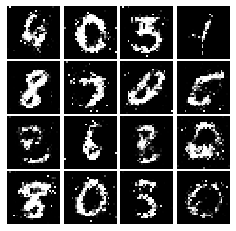

Epoch: 9, Iter: 4680, D: 0.2291, G:0.1561


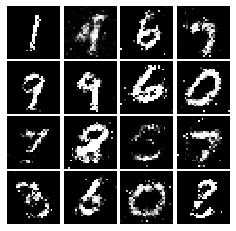

Final images


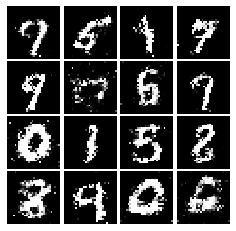

In [21]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [22]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    from tensorflow.keras import layers
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        layers.Reshape((28, 28,1), input_shape=(784,)),
        layers.Conv2D(32, 5, strides=(1, 1), padding='valid', activation = leaky_relu),
        layers.MaxPool2D(pool_size=(2, 2), strides=2),
        layers.Conv2D(64, 5, strides=(1, 1), padding='valid', activation = leaky_relu),
        layers.MaxPool2D(pool_size=(2, 2), strides=2),
        layers.Flatten(),
        layers.Dense(4*4*64 ,activation = leaky_relu),
        layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [23]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    from tensorflow.keras import layers
    model.add(layers.Dense(1024, input_shape=(noise_dim,), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(7*7*128, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Reshape((7, 7, 128)))
    model.add(layers.Conv2DTranspose(64, 4, strides=(2, 2),padding='same',activation = 'relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2DTranspose(1, 4, strides=(2, 2),padding='same',activation = 'tanh'))
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.412, G:0.654


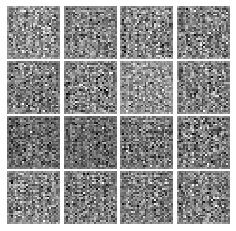

Epoch: 0, Iter: 20, D: 0.9938, G:2.185


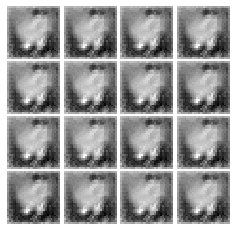

Epoch: 0, Iter: 40, D: 0.9015, G:1.494


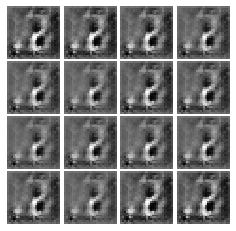

Epoch: 0, Iter: 60, D: 0.2893, G:3.628


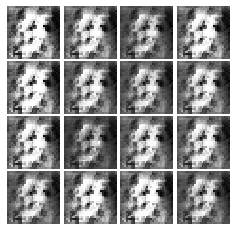

Epoch: 0, Iter: 80, D: 0.729, G:4.49


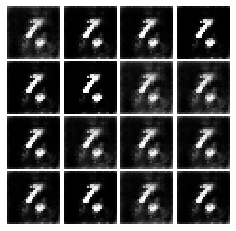

Epoch: 0, Iter: 100, D: 0.4002, G:2.611


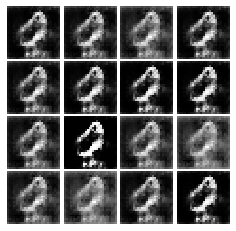

Epoch: 0, Iter: 120, D: 0.4273, G:2.157


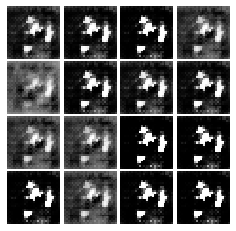

Epoch: 0, Iter: 140, D: 1.044, G:4.456


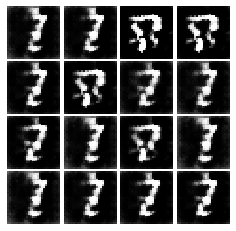

Epoch: 0, Iter: 160, D: 0.4419, G:2.957


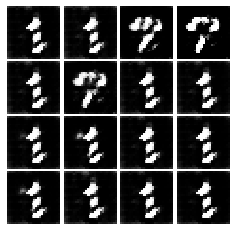

Epoch: 0, Iter: 180, D: 0.1368, G:3.406


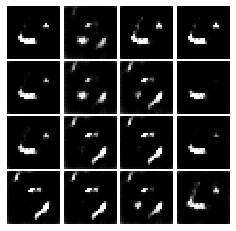

Epoch: 0, Iter: 200, D: 1.074, G:2.69


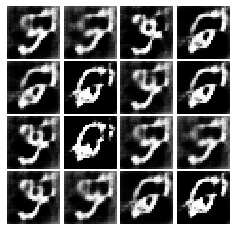

Epoch: 0, Iter: 220, D: 0.3988, G:3.477


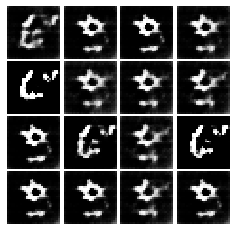

Epoch: 0, Iter: 240, D: 0.7539, G:1.67


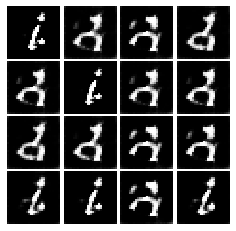

Epoch: 0, Iter: 260, D: 0.3085, G:3.525


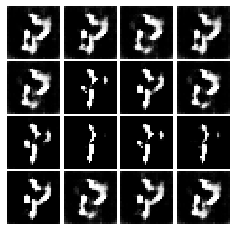

Epoch: 0, Iter: 280, D: 0.4953, G:2.685


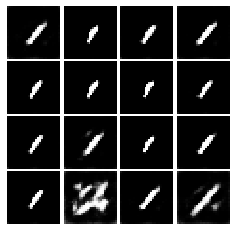

Epoch: 0, Iter: 300, D: 0.8637, G:1.809


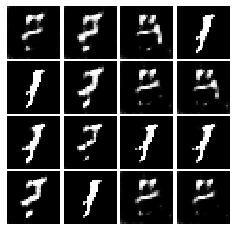

Epoch: 0, Iter: 320, D: 0.407, G:2.253


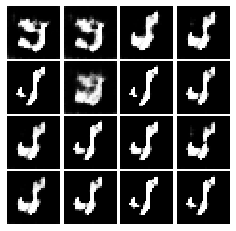

Epoch: 0, Iter: 340, D: 0.3319, G:3.65


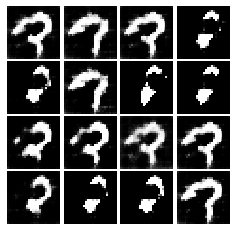

Epoch: 0, Iter: 360, D: 0.3341, G:2.797


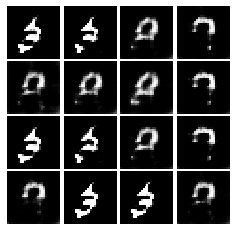

Epoch: 0, Iter: 380, D: 0.5217, G:2.336


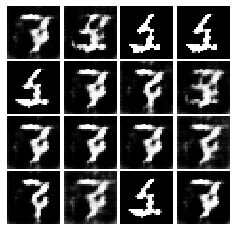

Epoch: 0, Iter: 400, D: 0.3784, G:4.758


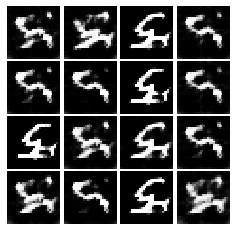

Epoch: 0, Iter: 420, D: 0.2562, G:3.786


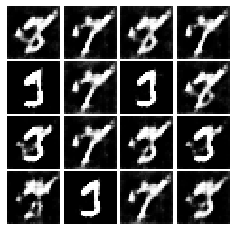

Epoch: 0, Iter: 440, D: 0.1321, G:4.138


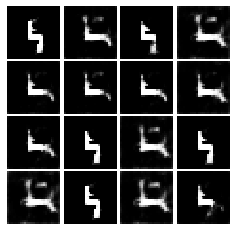

Epoch: 0, Iter: 460, D: 0.2268, G:3.236


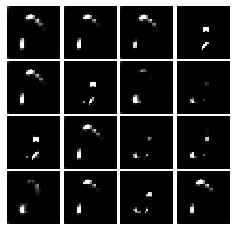

Epoch: 1, Iter: 480, D: 0.9646, G:4.381


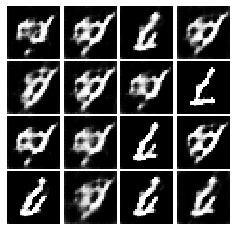

Epoch: 1, Iter: 500, D: 0.3638, G:2.924


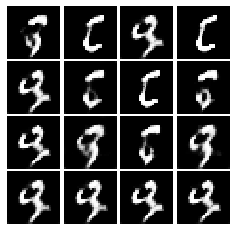

Epoch: 1, Iter: 520, D: 0.2572, G:3.316


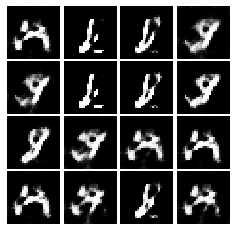

Epoch: 1, Iter: 540, D: 0.7844, G:1.12


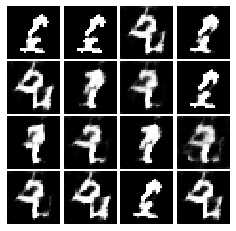

Epoch: 1, Iter: 560, D: 0.2598, G:4.408


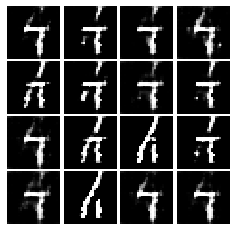

Epoch: 1, Iter: 580, D: 0.7208, G:3.459


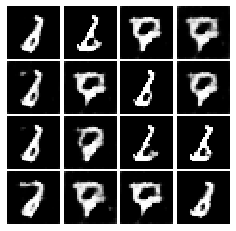

Epoch: 1, Iter: 600, D: 0.5129, G:2.238


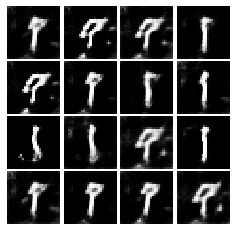

Epoch: 1, Iter: 620, D: 0.6655, G:2.711


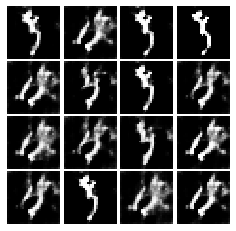

Epoch: 1, Iter: 640, D: 0.9566, G:2.758


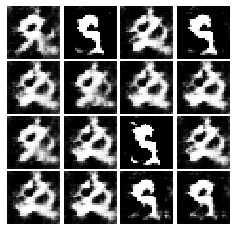

Epoch: 1, Iter: 660, D: 0.3196, G:4.011


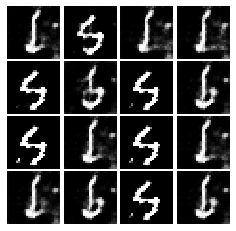

Epoch: 1, Iter: 680, D: 0.4873, G:2.662


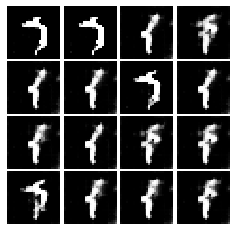

Epoch: 1, Iter: 700, D: 0.2473, G:3.753


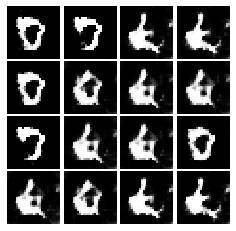

Epoch: 1, Iter: 720, D: 0.2737, G:4.559


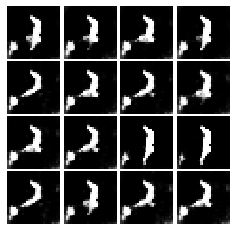

Epoch: 1, Iter: 740, D: 0.2282, G:4.532


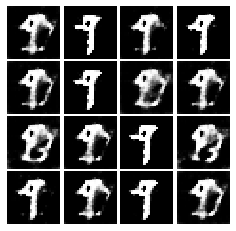

Epoch: 1, Iter: 760, D: 0.5894, G:2.622


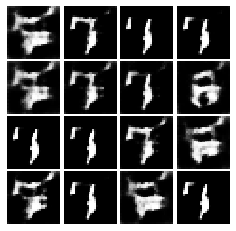

Epoch: 1, Iter: 780, D: 0.2704, G:5.782


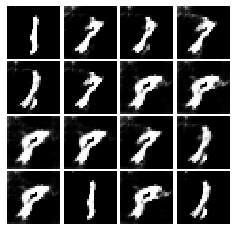

Epoch: 1, Iter: 800, D: 0.3568, G:2.593


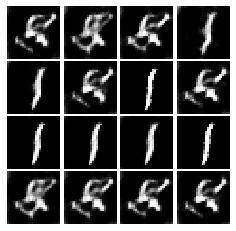

Epoch: 1, Iter: 820, D: 0.4592, G:4.614


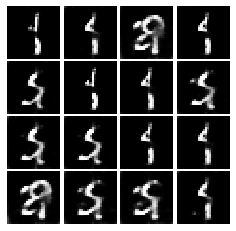

Epoch: 1, Iter: 840, D: 0.6928, G:6.316


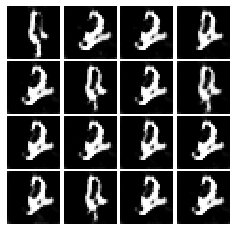

Epoch: 1, Iter: 860, D: 0.2327, G:3.71


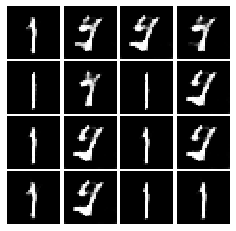

Epoch: 1, Iter: 880, D: 0.3742, G:3.064


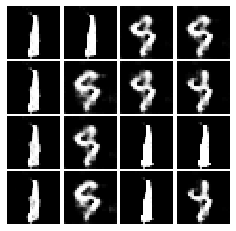

Epoch: 1, Iter: 900, D: 0.507, G:4.579


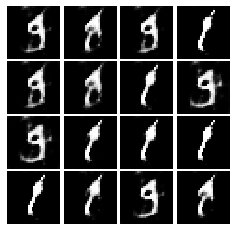

Epoch: 1, Iter: 920, D: 0.3066, G:2.909


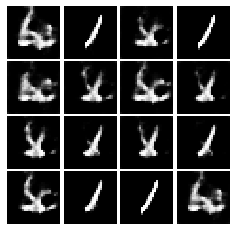

Epoch: 2, Iter: 940, D: 0.1532, G:4.301


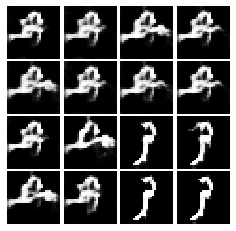

Epoch: 2, Iter: 960, D: 0.4419, G:3.609


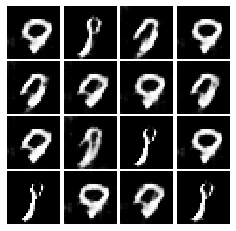

Epoch: 2, Iter: 980, D: 0.2004, G:3.8


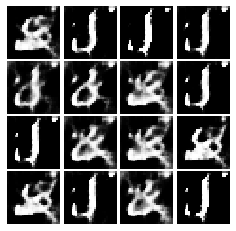

Epoch: 2, Iter: 1000, D: 0.1834, G:3.993


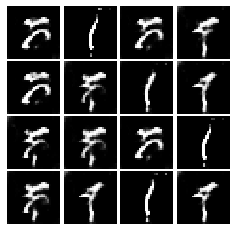

Epoch: 2, Iter: 1020, D: 0.2868, G:3.313


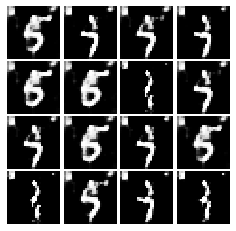

Epoch: 2, Iter: 1040, D: 0.207, G:4.377


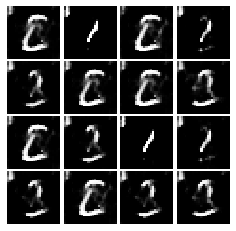

Epoch: 2, Iter: 1060, D: 0.2566, G:3.212


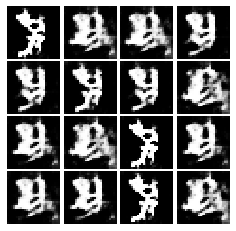

Epoch: 2, Iter: 1080, D: 0.1362, G:3.648


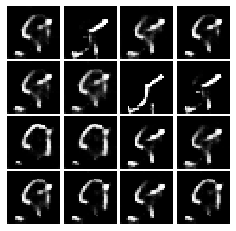

Epoch: 2, Iter: 1100, D: 1.183, G:10.05


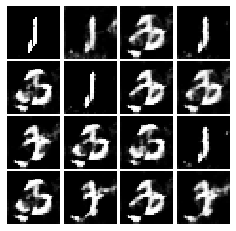

Epoch: 2, Iter: 1120, D: 0.2813, G:2.99


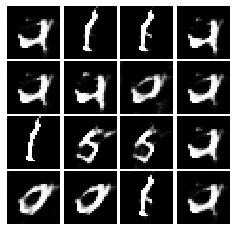

Epoch: 2, Iter: 1140, D: 0.5407, G:3.806


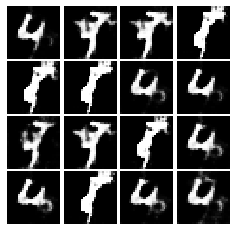

Epoch: 2, Iter: 1160, D: 0.2866, G:5.428


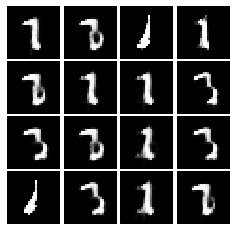

Epoch: 2, Iter: 1180, D: 0.6487, G:8.461


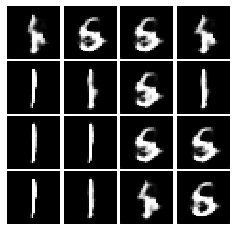

Epoch: 2, Iter: 1200, D: 0.2998, G:4.351


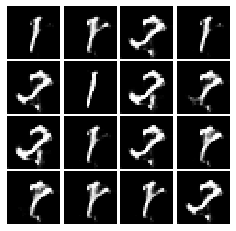

Epoch: 2, Iter: 1220, D: 0.375, G:3.429


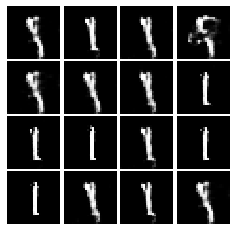

Epoch: 2, Iter: 1240, D: 0.4599, G:4.763


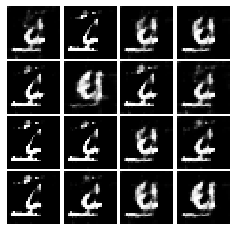

Epoch: 2, Iter: 1260, D: 0.1477, G:4.701


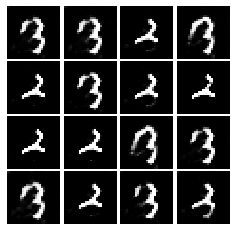

Epoch: 2, Iter: 1280, D: 0.2513, G:5.26


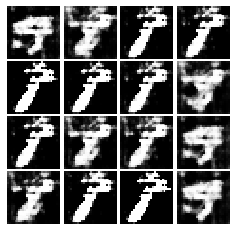

Epoch: 2, Iter: 1300, D: 0.8541, G:8.54


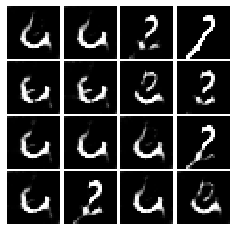

Epoch: 2, Iter: 1320, D: 0.9252, G:5.292


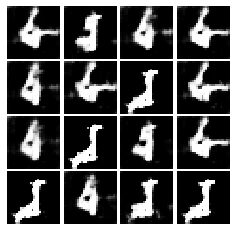

Epoch: 2, Iter: 1340, D: 0.8074, G:4.613


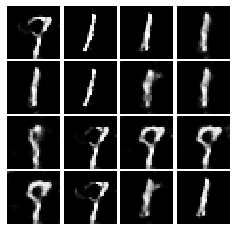

Epoch: 2, Iter: 1360, D: 0.1739, G:3.73


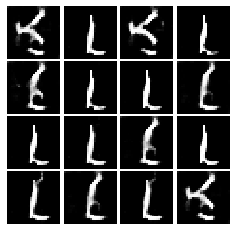

Epoch: 2, Iter: 1380, D: 0.2127, G:3.038


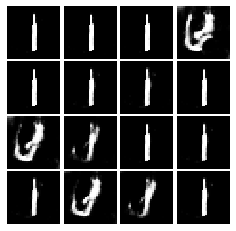

Epoch: 2, Iter: 1400, D: 0.07041, G:5.484


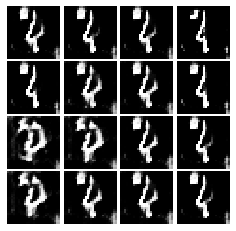

Epoch: 3, Iter: 1420, D: 0.06225, G:3.807


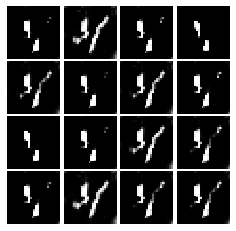

Epoch: 3, Iter: 1440, D: 0.2663, G:11.73


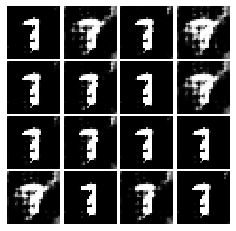

Epoch: 3, Iter: 1460, D: 0.6935, G:5.598


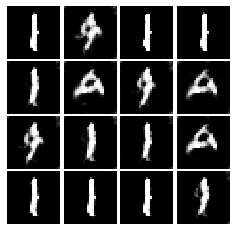

Epoch: 3, Iter: 1480, D: 0.1494, G:3.986


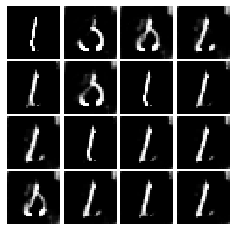

Epoch: 3, Iter: 1500, D: 0.3314, G:3.501


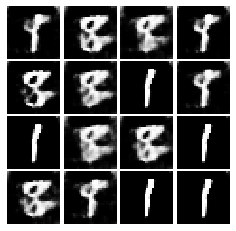

Epoch: 3, Iter: 1520, D: 0.2929, G:4.048


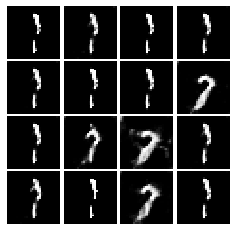

Epoch: 3, Iter: 1540, D: 0.1567, G:3.603


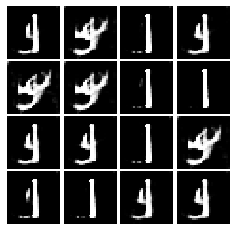

Epoch: 3, Iter: 1560, D: 0.143, G:2.92


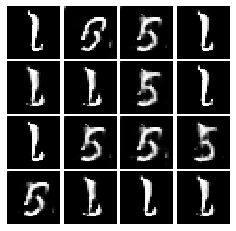

Epoch: 3, Iter: 1580, D: 0.3046, G:4.443


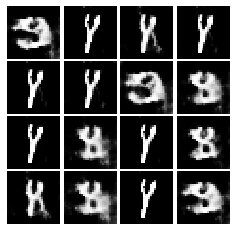

Epoch: 3, Iter: 1600, D: 0.1415, G:4.742


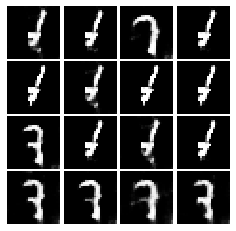

Epoch: 3, Iter: 1620, D: 0.3701, G:5.479


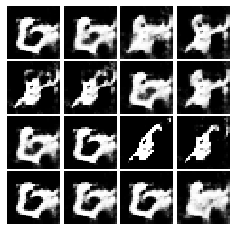

Epoch: 3, Iter: 1640, D: 0.1655, G:4.692


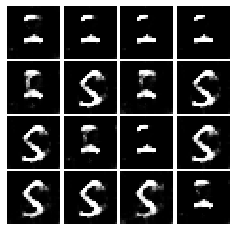

Epoch: 3, Iter: 1660, D: 0.06482, G:4.683


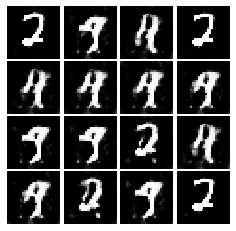

Epoch: 3, Iter: 1680, D: 0.187, G:3.34


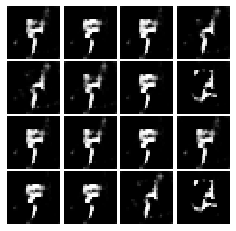

Epoch: 3, Iter: 1700, D: 0.3936, G:3.075


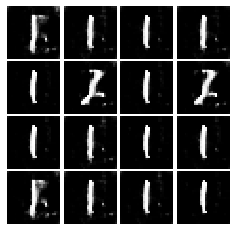

Epoch: 3, Iter: 1720, D: 0.4099, G:3.25


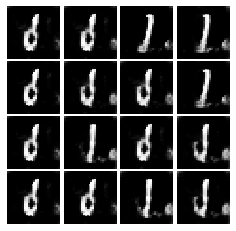

Epoch: 3, Iter: 1740, D: 0.3957, G:4.721


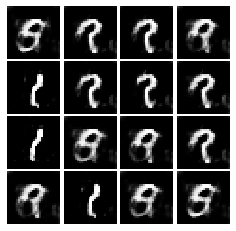

Epoch: 3, Iter: 1760, D: 0.3739, G:4.582


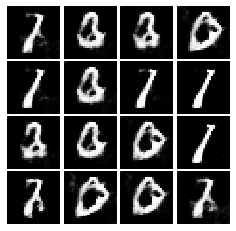

Epoch: 3, Iter: 1780, D: 0.3174, G:3.68


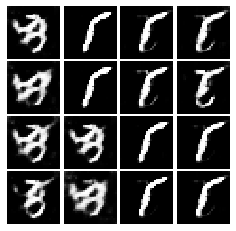

Epoch: 3, Iter: 1800, D: 0.3588, G:2.559


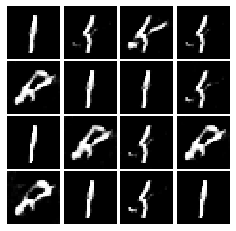

Epoch: 3, Iter: 1820, D: 0.507, G:2.725


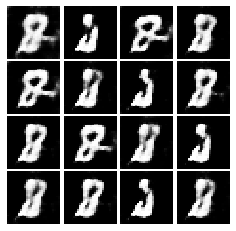

Epoch: 3, Iter: 1840, D: 0.5251, G:7.696


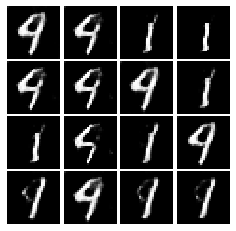

Epoch: 3, Iter: 1860, D: 0.2499, G:3.132


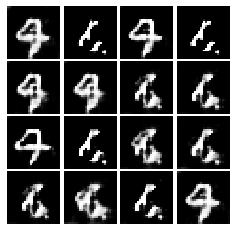

Epoch: 4, Iter: 1880, D: 0.2111, G:3.724


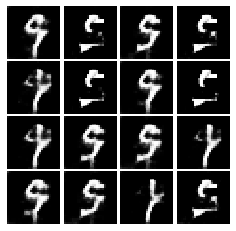

Epoch: 4, Iter: 1900, D: 0.06981, G:5.687


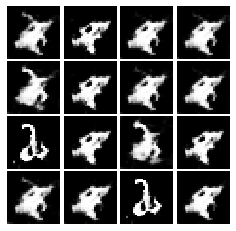

Epoch: 4, Iter: 1920, D: 0.3149, G:4.573


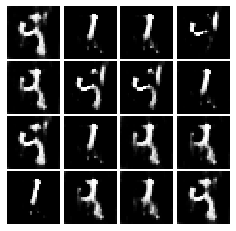

Epoch: 4, Iter: 1940, D: 0.2246, G:3.728


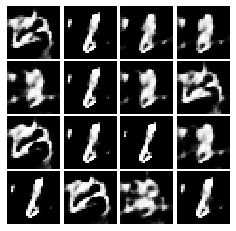

Epoch: 4, Iter: 1960, D: 0.2913, G:3.63


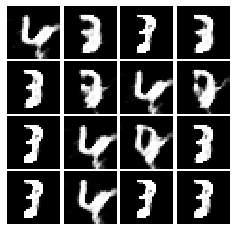

Epoch: 4, Iter: 1980, D: 1.688, G:2.914


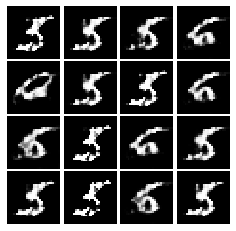

Epoch: 4, Iter: 2000, D: 0.1834, G:5.241


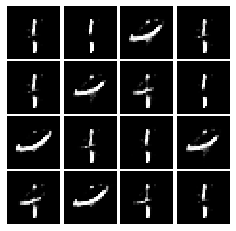

Epoch: 4, Iter: 2020, D: 0.2226, G:4.112


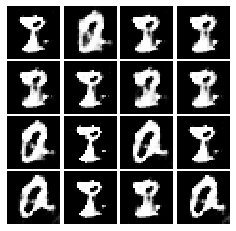

Epoch: 4, Iter: 2040, D: 0.03561, G:4.854


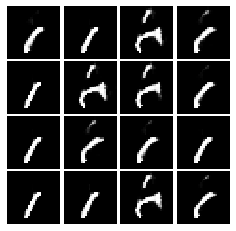

Epoch: 4, Iter: 2060, D: 0.03415, G:5.978


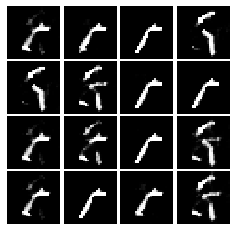

Epoch: 4, Iter: 2080, D: 0.6549, G:3.865


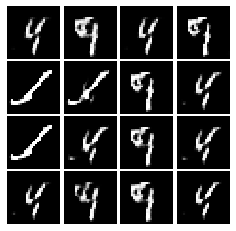

Epoch: 4, Iter: 2100, D: 0.1304, G:4.439


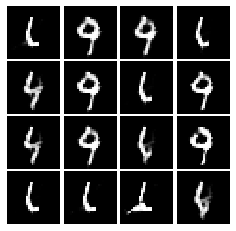

Epoch: 4, Iter: 2120, D: 0.1994, G:4.286


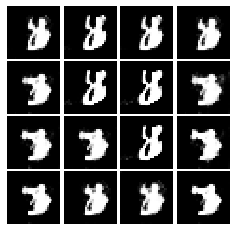

Epoch: 4, Iter: 2140, D: 0.655, G:7.476


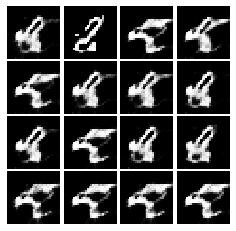

Epoch: 4, Iter: 2160, D: 0.09709, G:5.943


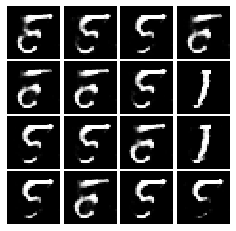

Epoch: 4, Iter: 2180, D: 0.1899, G:4.913


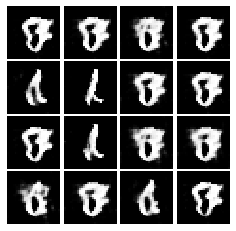

Epoch: 4, Iter: 2200, D: 0.1238, G:6.54


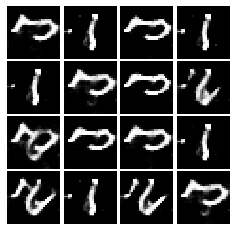

Epoch: 4, Iter: 2220, D: 0.2851, G:3.237


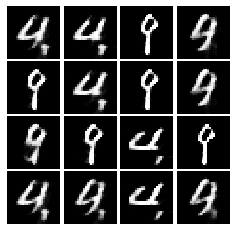

Epoch: 4, Iter: 2240, D: 0.1696, G:4.061


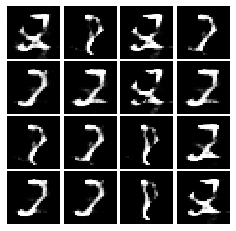

Epoch: 4, Iter: 2260, D: 0.8927, G:5.479


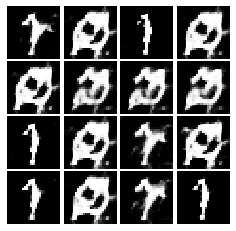

Epoch: 4, Iter: 2280, D: 0.2896, G:2.84


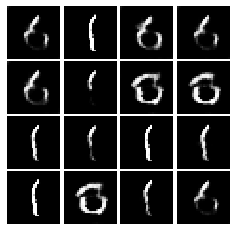

Epoch: 4, Iter: 2300, D: 0.2559, G:3.602


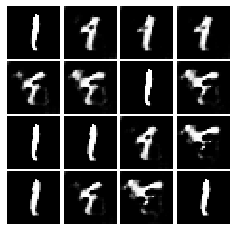

Epoch: 4, Iter: 2320, D: 0.1663, G:3.713


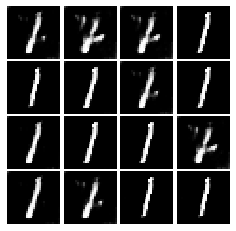

Epoch: 4, Iter: 2340, D: 0.4202, G:4.749


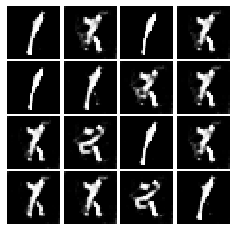

Final images


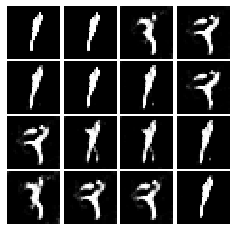

In [24]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)